# Regression models

##### Authored by [Tal Rave](https://www.linkedin.com/in/tal-rave-59833715a)

In this project I will implement the regression algorithms described in chapter 8 of Simon J.D. Prince's book [[1](http://www.computervisionmodels.com/)] - these include the following:

- [Linear regression](#lr)
- [Bayesian linear regression](#blr)
- [Gaussian process regression](#gpr)
- [Sparse linear regression](#slr)
- [Dual Bayesian linear regression](#dblr)
- [Dual Gaussian process regression](#dgpr)
- [Relevance vector regression](#rvr)

Note that all the algorithm descriptions in this project are copied from [[3](http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf)].

In [1]:
import numpy as np
from numpy import newaxis as x
from numpy import log
from numpy.linalg import inv, det
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal as norm
from scipy.stats import multivariate_t as stud
from scipy.stats import gamma

dpi = 100

# multiplies a series of matrices
def mm(*mats):
    m = np.matmul(mats[0], mats[1])
    for mat in mats[2:]:
        m = np.matmul(m, mat)
    return m

# plots the Log (marginal) Likelihood
def plotObjective(L):
    plt.title('Objective')
    plt.xlabel('Epoch')
    plt.ylabel('Log Likelihood')
    plt.plot(L)

<a id='lr'></a>

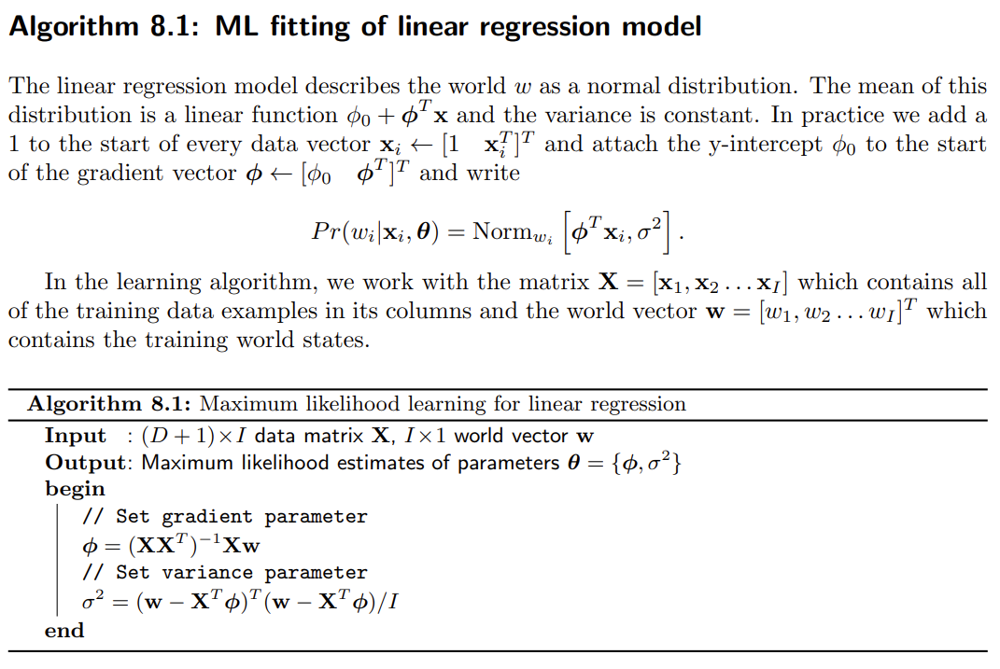

Let's implement the model as a simple method...

In [2]:
def LR(X, w):
    n, D = X.shape
    X = np.concatenate([np.ones([1,n]), X.T], axis=0) # add 1's for bias (each column is a data point)
    w = w[:,x]
    p = mm(inv(mm(X, X.T)), X, w)
    s = w - mm(X.T, p)
    s = np.squeeze(mm(s.T, s) / n)
    return p, s

Let's fit appropriate models to some randomly sampled noisy lines and plot the predictions along with 95% confidence intervals...

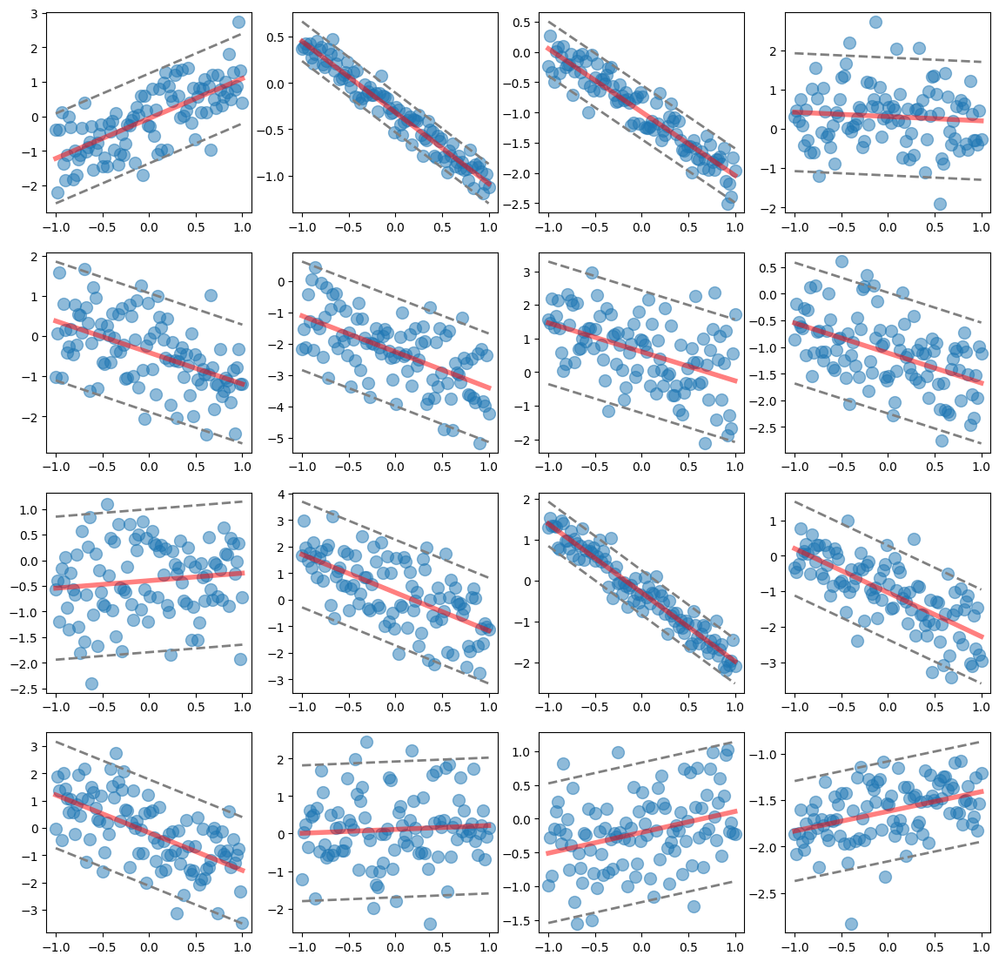

In [3]:
def sampleNoisyLine(X, a=1, b=2, s=100):
    w = np.random.normal(a + b * X, s**0.5)
    return X[:,x], w


plt.figure(figsize=(14,14), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyLine(X=np.linspace(-1, 1, 100),
                           a=np.random.normal(),
                           b=np.random.normal(), 
                           s=np.random.rand())
    plt.subplot(4,4,i+1)
    plt.scatter(X, w, s=100, alpha=0.5)
    p, s = LR(X, w)
    plt.plot([-1, 1], [p[0] + x*p[1] for x in [-1,1]], linewidth=4, color='red', alpha=0.5)
    plt.plot([-1, 1], [p[0] + 1.96 * s**0.5 + x*p[1] for x in [-1,1]], linewidth=2, color='gray', linestyle='dashed') 
    plt.plot([-1, 1], [p[0] - 1.96 * s**0.5 + x*p[1] for x in [-1,1]], linewidth=2, color='gray', linestyle='dashed')

Let's fit appropriate models to some randomly sampled noisy planes and plot the predictions along with 95% confidence intervals...

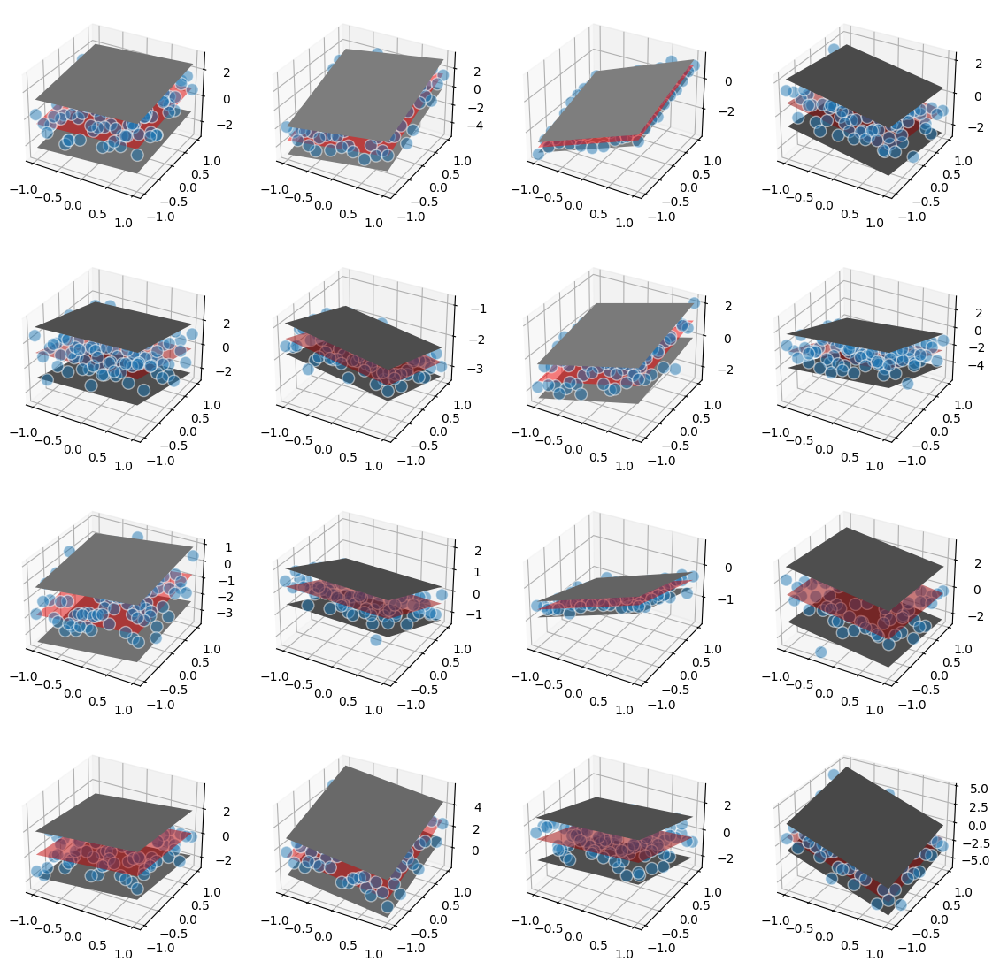

In [4]:
def sampleNoisyPlane(X, a=1, b=-2, c=3, s=100):
    X = np.stack(np.meshgrid(X, X), axis=-1).reshape([-1,2])
    w = np.random.normal(a + b * X[:,0] + c * X[:,1], s**0.5) 
    return X, w


fig = plt.figure(figsize=(14,14), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyPlane(X=np.linspace(-1, 1, 10),
                            a=np.random.normal(), 
                            b=np.random.normal(),
                            c=np.random.normal(),
                            s=np.random.rand())
    p, s = LR(X, w)
    ax = fig.add_subplot(4, 4, i+1, projection ="3d")
    ax.scatter3D(X[:,0], X[:,1], w, s=100, edgecolors='white', alpha=0.5)
    X, Y = np.meshgrid([-1,1], [-1,1])
    ax.plot_surface(X, Y, Z=np.array([p[0] + p[1]*x + p[2]*y for x, y in zip(X,Y)]).reshape(2,2), color='red', alpha=0.5)
    ax.plot_surface(X, Y, Z=np.array([p[0] + p[1]*x + p[2]*y + 1.96*s**0.5 for x, y in zip(X,Y)]).reshape(2,2), color='gray')
    ax.plot_surface(X, Y, Z=np.array([p[0] + p[1]*x + p[2]*y - 1.96*s**0.5 for x, y in zip(X,Y)]).reshape(2,2), color='gray')

<a id='blr'></a>

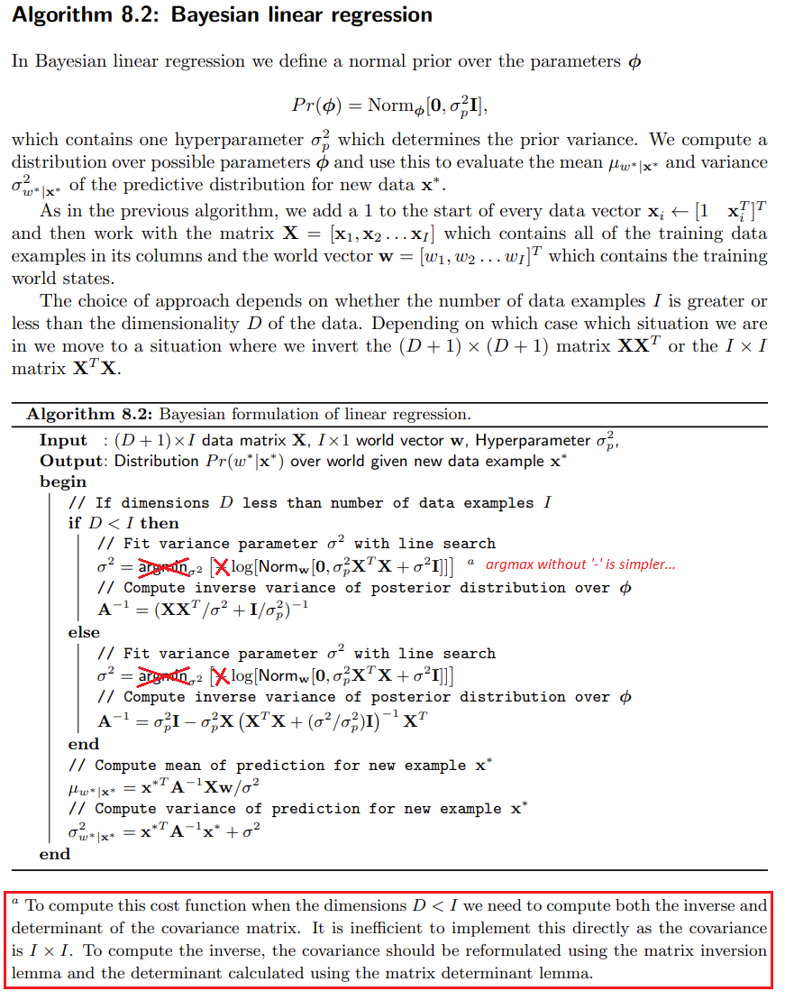

It should be noted that A would be very large if D is large, and so it might be better to incorporate it only during inference to save memory. See my factor analysis implementation [[5](https://nbviewer.org/github/tal4080/EM-Algo/blob/main/EM-Algo.ipynb)] for more details about the above lemmas.

Let's define a class for this model...

In [5]:
class BLR():
    

    def __init__(self, X, w, sp=1e+3, S=100):
        
        S = np.linspace(np.var(w), 0, S, endpoint=False)
        n, D = X.shape
        X = self.X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        w = self.w = w[:,x]
        
        if D < n:
            # incorporate the determinant lemma and the Sherman-Morrison-Woodbury relation
            t = inv(mm(X, X.T) + S[:,x,x] / sp * np.identity(D+1))
            logDet = n*log(S) - np.linalg.slogdet(t)[1]
            SMW = (-n*log(2*np.pi) - logDet - (np.sum(w**2) - mm(w.T, X.T, t, X, w)[:,0,0]) / S) / 2
            s = S[np.argmax(SMW)]
            Z = inv(mm(X, X.T) / s + np.identity(D+1) / sp)    
        else:
            s = S[np.argmax([norm.logpdf(w[:,0], np.zeros([n]), sp * mm(X.T, X) + s * np.identity(n)) for s in S])]
            Z = sp * np.identity(D+1) - sp * mm(X, inv(mm(X.T, X) + s / sp * np.identity(n)), X.T)
            
        self.Z = Z
        self.u = mm(Z, X, w) / s
        self.s = s
        
    
    # predicts a distribution for example y
    def pred(self, y):
        
        y = np.concatenate([[1], y], axis=-1)[:,x]
        Z, u, s = self.Z, self.u, self.s
        u = mm(y.T, u)[0,0]
        s = mm(y.T, Z, y)[0,0] + s
        return u, s

Let's fit appropriate models to some randomly sampled noisy lines and visualize the predicted distributions over a range of examples...

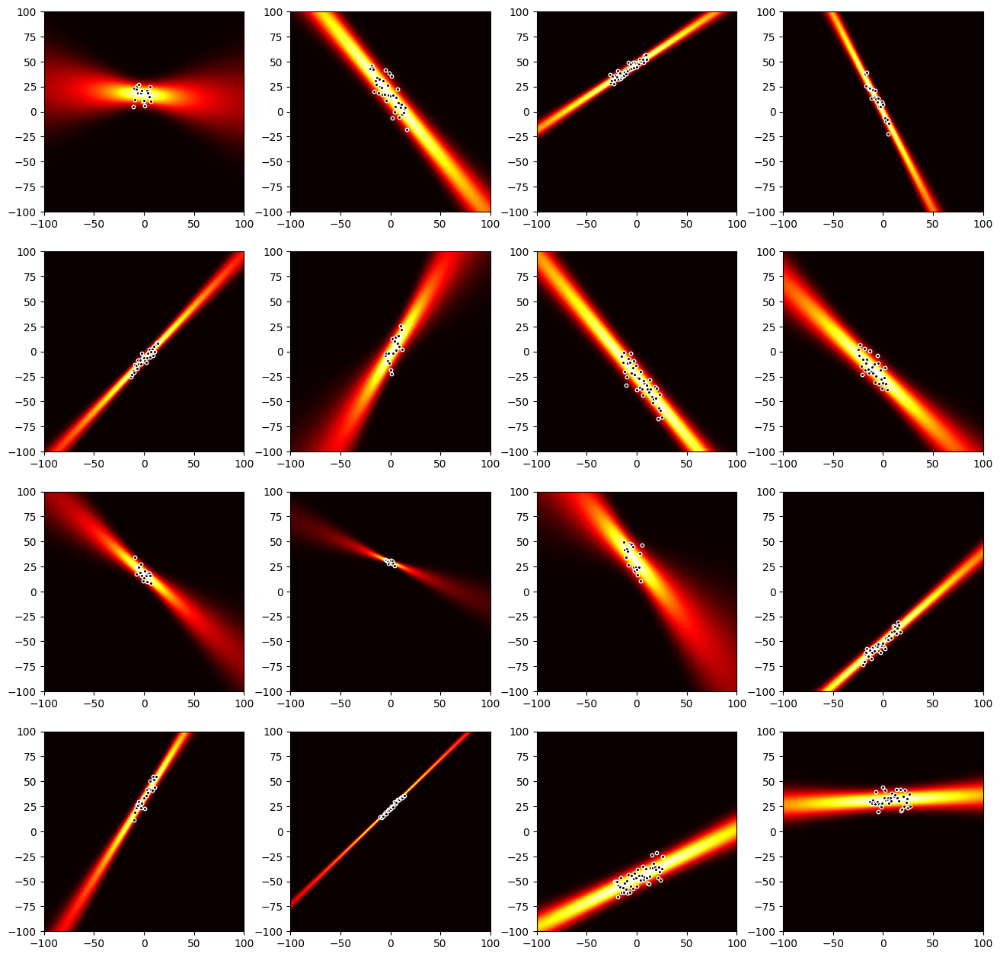

In [6]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    blr = BLR(X, w)
    t = np.array([norm.pdf(np.linspace(-100,100,200)[::-1],
                           *blr.pred(np.array([y]))) for y in np.linspace(-100,100,200)]).reshape([200,200]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[-100,100,-100,100])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

As expected, prediction confidence drops as examples deviate from the mean.

<a id='gpr'></a>

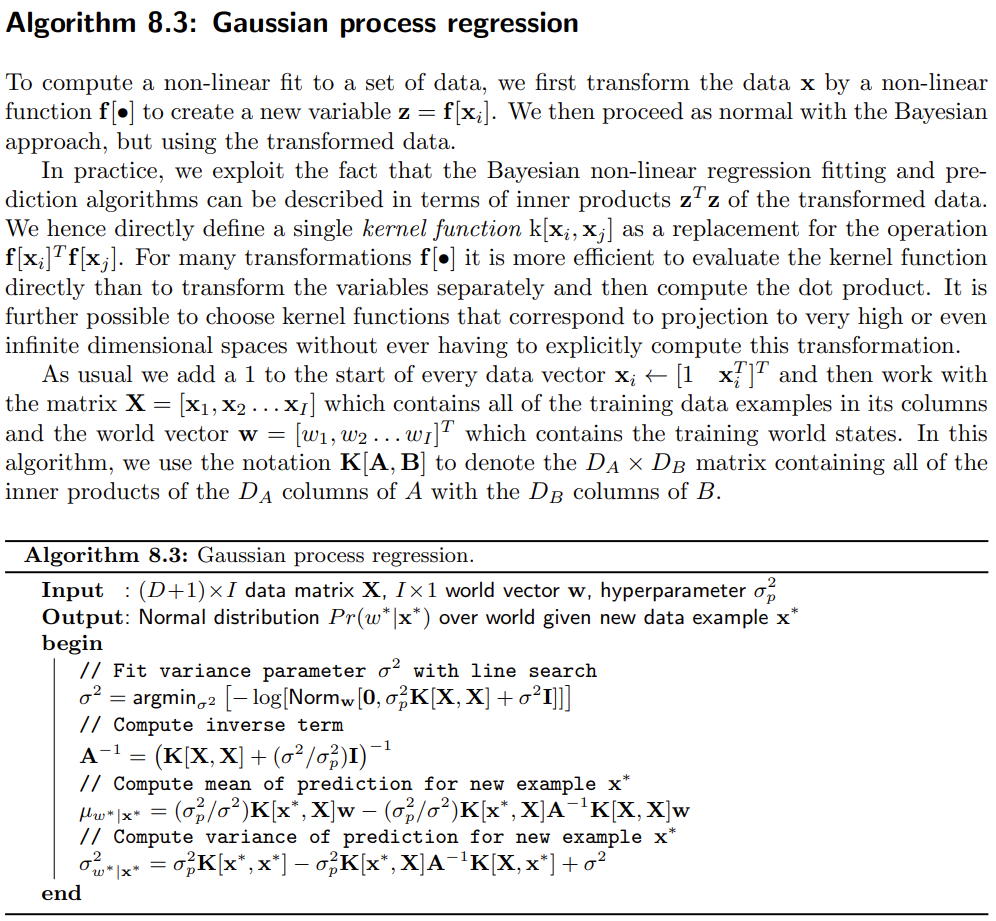

Let's define a class for this model...

In [7]:
class GPR():
     
    # K is the kernel and args holds its optional constants
    def __init__(self, X, w, K, args=[], sp=1e+3, S=100): 

        S = np.linspace(np.var(w), 0, S, endpoint=False)
        n, D = X.shape
        self.X = X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        self.w = w = w[:,x]
        self.sp = sp
        self.K = K
        self.args = args
        self.s = s = S[np.argmax([norm.logpdf(w[:,0], np.zeros([n]), sp * K(X,X,*args) + s * np.identity(n)) for s in S])]
        self.A = inv(K(X,X,*args) + (s / sp) * np.identity(n))
        
    
    def pred(self, y):
        
        y = np.concatenate([[1], y], axis=-1)[:,x]
        X, w, sp, K, args, s, A = self.X, self.w, self.sp, self.K, self.args, self.s, self.A
        u = sp / s * mm(K(y,X,*args), np.identity(X.shape[-1]) - mm(A, K(X,X,*args)), w)[0,0]
        s = sp * (K(y,y,*args) - mm(K(y,X,*args), A, K(X,y,*args)))[0,0] + s
        return u, s

Let's define a few kernel functions...

In [8]:
def linear(A, B, smooth=1):
    return mm(A.T, B) / smooth**2

def polynomial(A, B, k, smooth=1):
    return (mm(A.T, B) / smooth**2 + 1)**k

def RBF(A, B, smooth=1):
    X = A[:,:,x] - B[:,x,:]
    X = np.exp(-0.5 * np.sum(X**2, axis=0) / smooth**2)
    return X

Let's use a linear kernel to fit appropriate models to some randomly sampled noisy lines and visualize the predicted distributions over a range of examples...

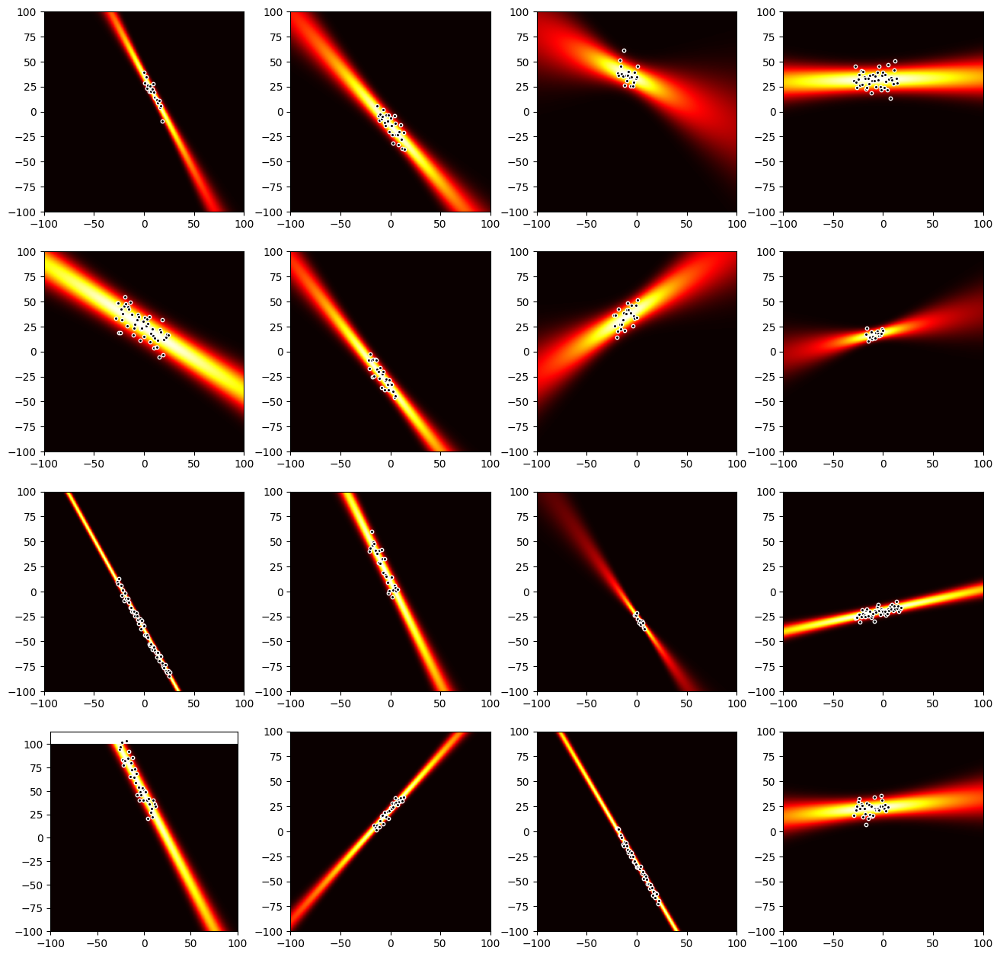

In [9]:
start, end, n = -100, 100, 200
ls = np.linspace(start,end,n)
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    gpr = GPR(X, w, K=linear)
    t = np.array([norm.pdf(ls[::-1], *gpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use a degree 2 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 2 polynomials and visualize the predicted distributions over a range of examples...

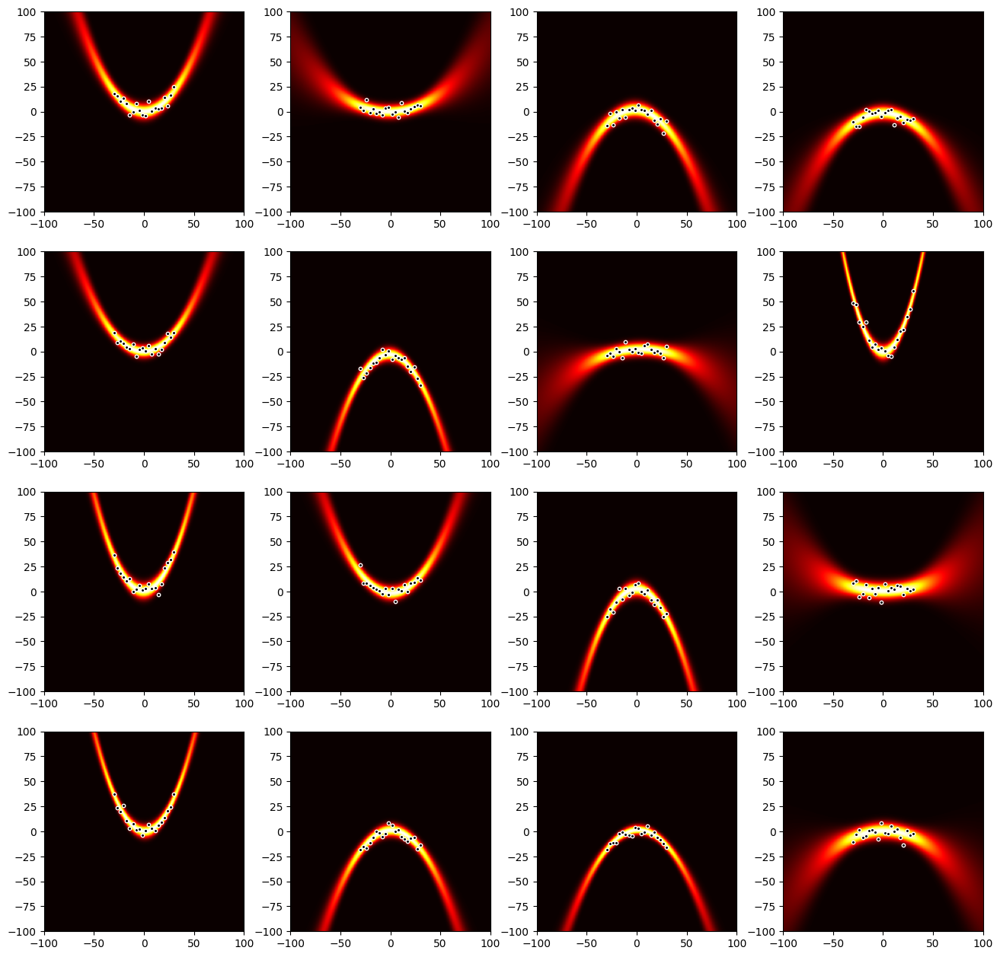

In [10]:
def sampleNoisyPolynomial(coefs, s=20, start=-30, end=30, n=20):
    X = np.linspace(start, end, n)[:,x]
    w = np.random.normal(np.sum(coefs * X.repeat(len(coefs), axis=-1) ** np.arange(len(coefs)), axis=-1), s**0.5)
    return X, w


plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=3)/40)
    gpr = GPR(X, w, K=polynomial, args=[2, 2])
    t = np.array([norm.pdf(ls[::-1], *gpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use a degree 3 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 3 polynomials and visualize the predicted distributions over a range of examples...

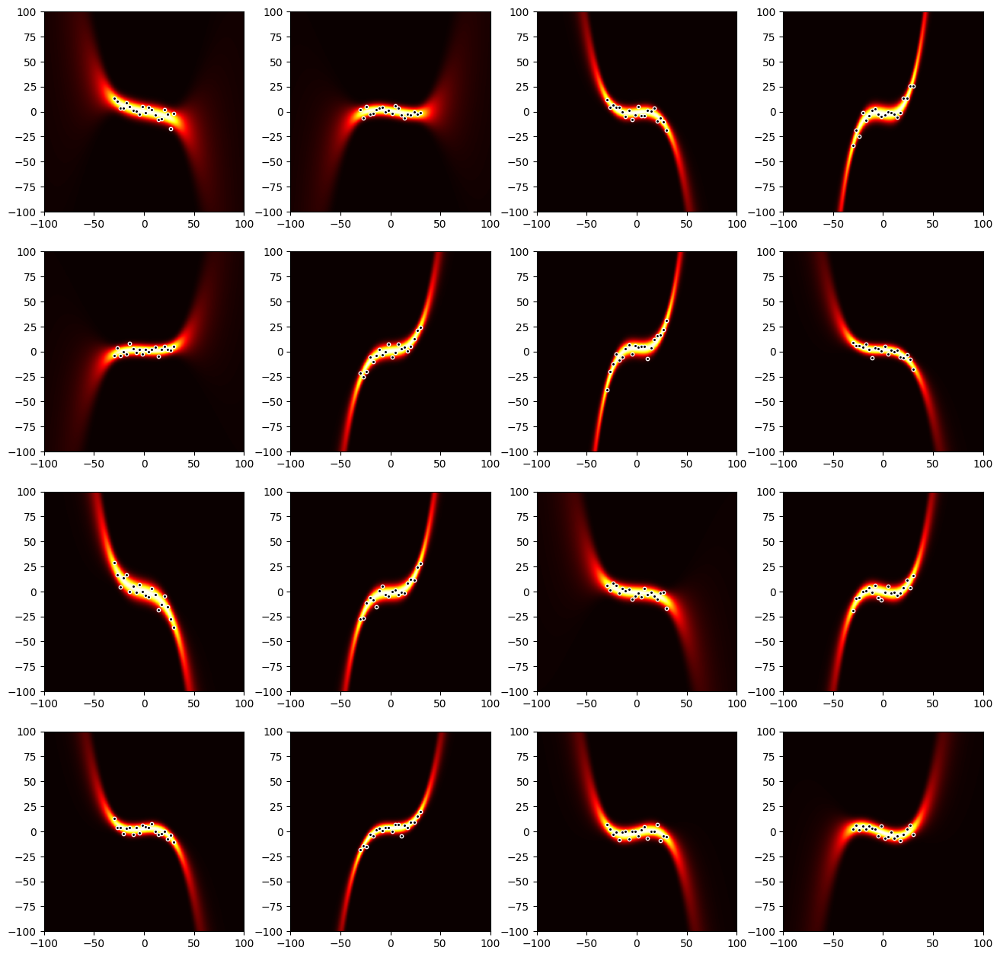

In [11]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=4)/1000)
    gpr = GPR(X, w, K=polynomial, args=[3, 6])
    t = np.array([norm.pdf(ls[::-1], *gpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use an RBF kernel to fit appropriate models to some randomly sampled noisy weighted sums of RBFs and visualize the predicted distributions over a range of examples...

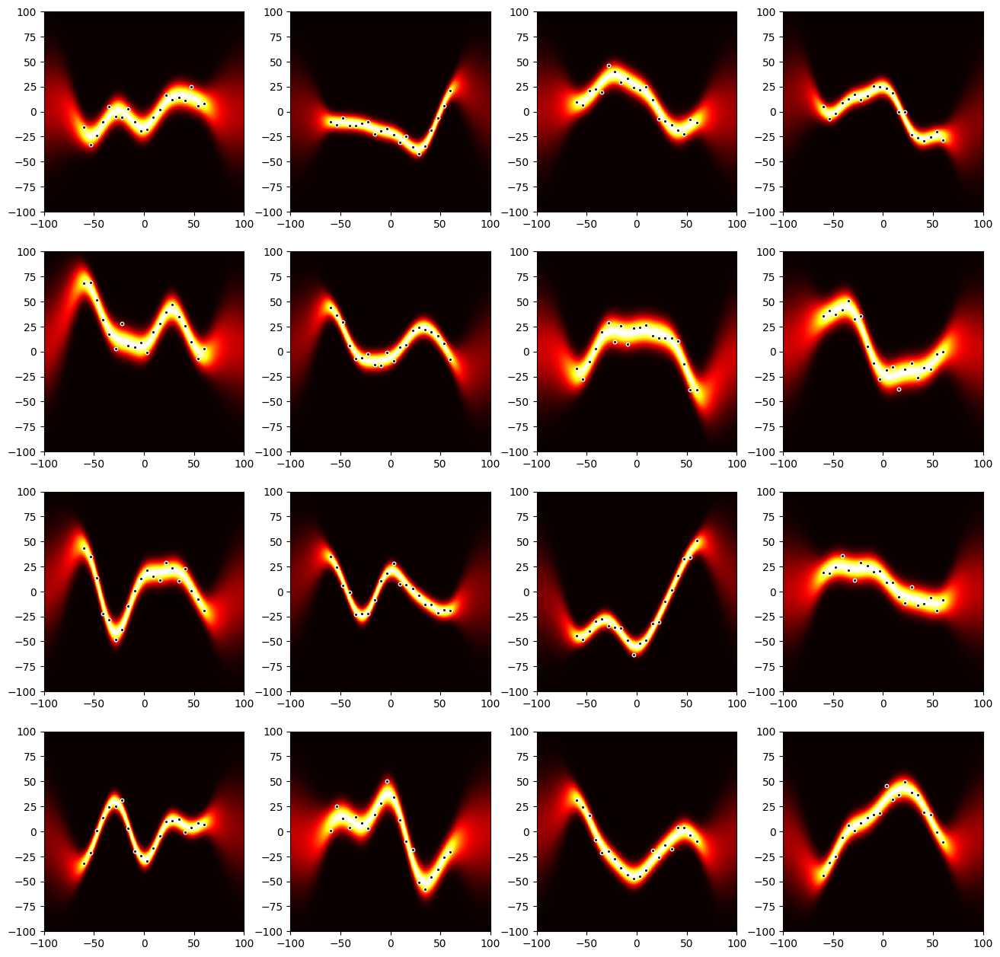

In [12]:
def sampleNoisyRBF(X, centers, coefs, s=0.05, k=0.1): 
    X = X[:,x]
    w = np.random.normal(np.sum(coefs * np.exp(-(X.repeat(len(centers), axis=-1) - centers)**2 / k), axis=-1), s**0.5)
    return X, w


plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyRBF(X=np.linspace(-1,1,20), coefs=np.random.normal(size=5), centers=np.linspace(-1,1,5))
    X *= 60
    w *= 30
    gpr = GPR(X, w, K=RBF, args=[20])
    t = np.array([norm.pdf(ls[::-1], *gpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

<a id='slr'></a>

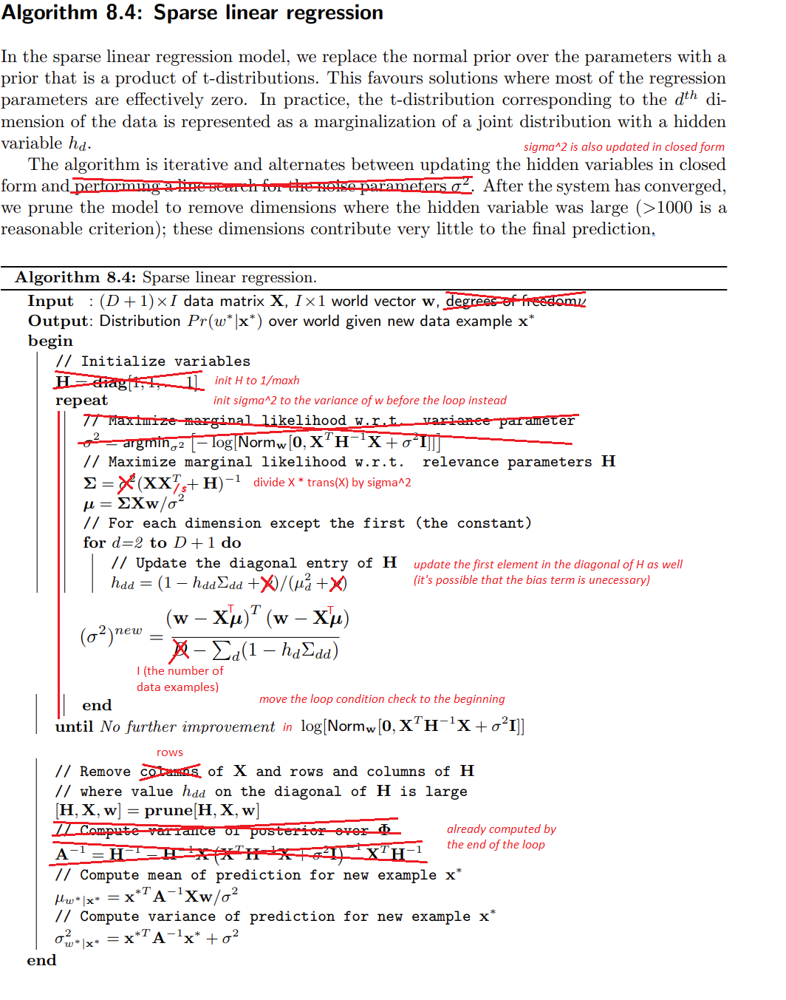

Strangely, the above algorithm contained quite a few mistakes; its description is inconsistent with the relevant material in the book, which itself is also somewhat inconsistent with the source literature on which it is based.

Let's define a class for this model...

In [13]:
class SLR():
    
    # delta = stop condition, epochs = max num of iters, disp = display log likelihood?
    def __init__(self, X, w, delta=1e-3, maxh=1e+3, epochs=100, disp=False):
        
        n, D = X.shape
        X = self.X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        w = self.w = w[:,x]
        s = np.var(w)
        H = np.full(D+1, 1/maxh)
        L = [-np.inf]
        
        while epochs:
            # calc and store log likelihood
            L.append(norm.logpdf(w[:,0], np.zeros([n]), mm(X.T / H, X) + s * np.identity(n)))
            if L[-1] - L[-2] < delta:
                break
            Z = inv(mm(X,X.T) / s + np.diag(H))
            u = mm(Z, X, w) / s
            s = np.sum((w - mm(X.T,u))**2) / (n - np.sum(1 - H * np.diag(Z)))
            H = np.minimum((1 - H * np.diag(Z)) / u[:,0]**2, maxh)
            epochs -= 1
            
        if disp:
            plotObjective(L[1:])
            
        # prune Z and u
        self.r = r = H < maxh
        self.Z = Z[r][:,r]
        self.u = u[r]
        self.s = s
        
    def pred(self, y):
        r, Z, u, s = self.r, self.Z, self.u, self.s
        y = np.concatenate([[1], y], axis=-1)[r][:,x]
        u = mm(y.T, u)[0,0]
        s = mm(y.T, Z, y)[0,0] + s
        return u, s

Let's fit appropriate models to some randomly sampled noisy lines with an added noisy 3rd dimension, illustrate the algorithm's convergence and pruning, and visualize the predicted distributions over a range of examples...

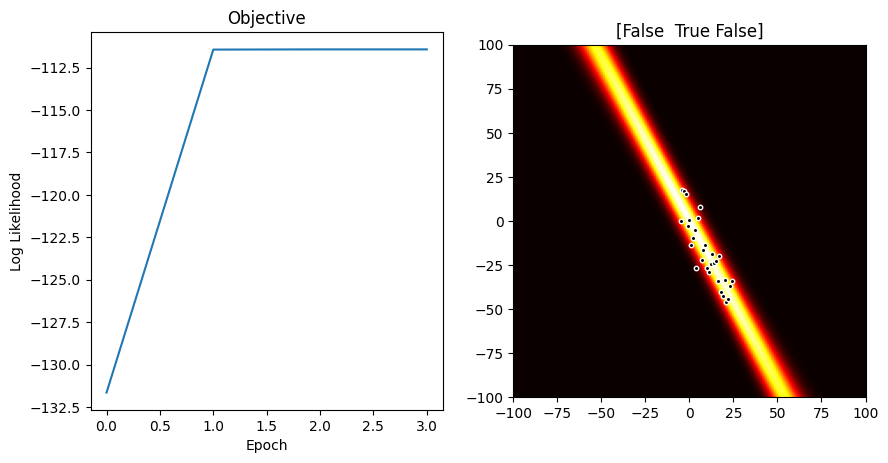

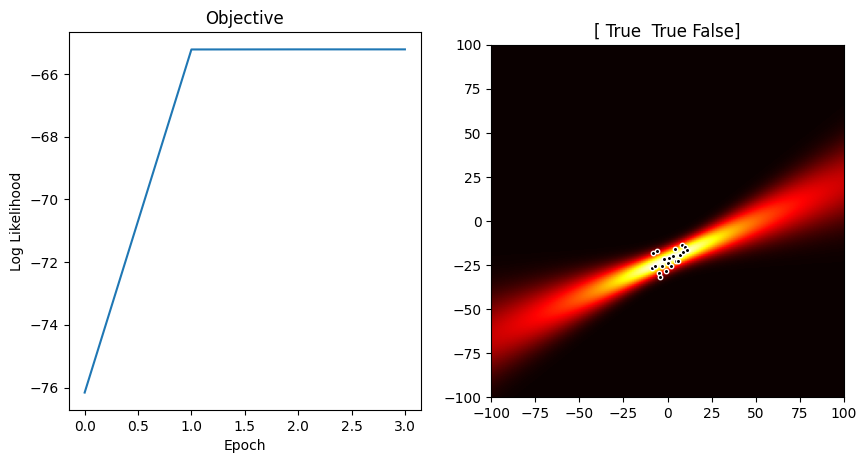

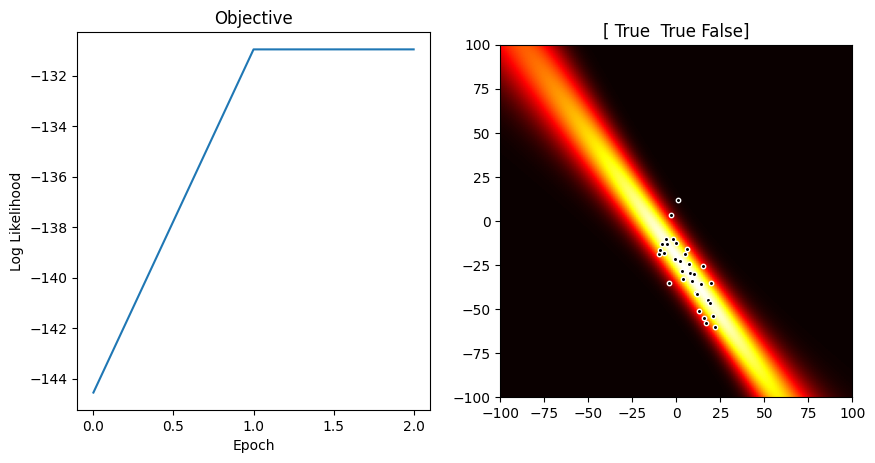

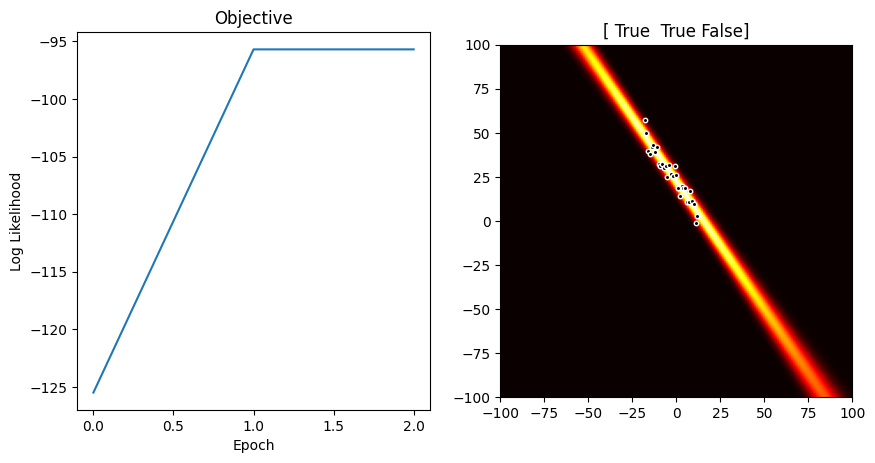

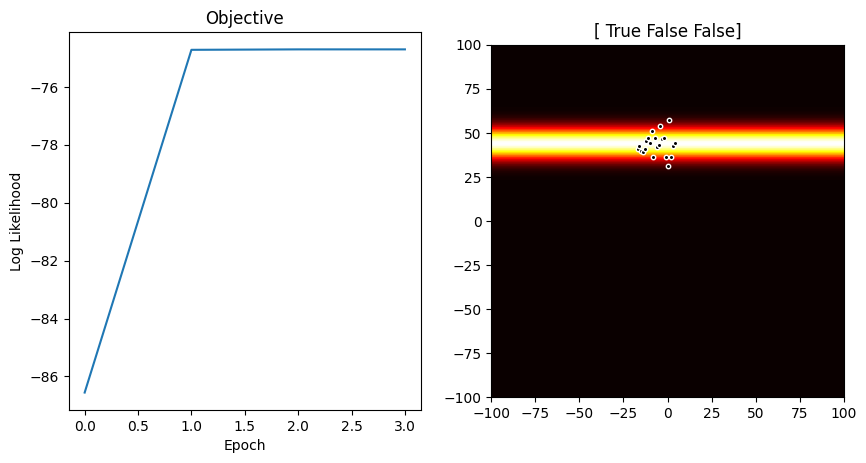

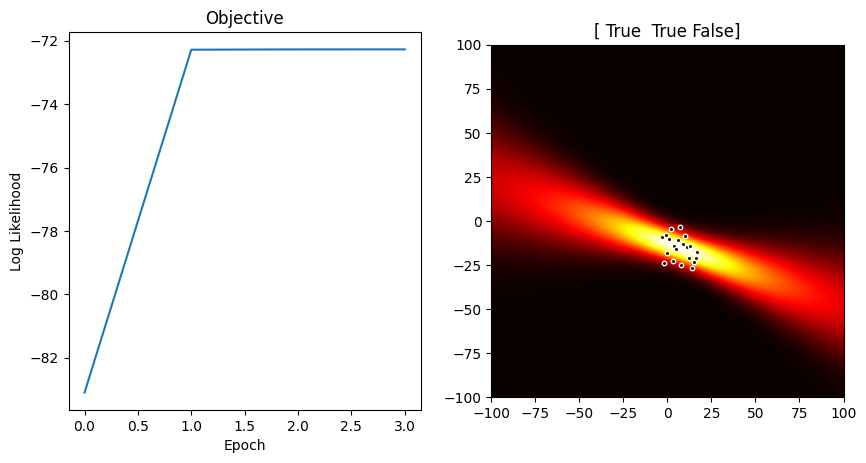

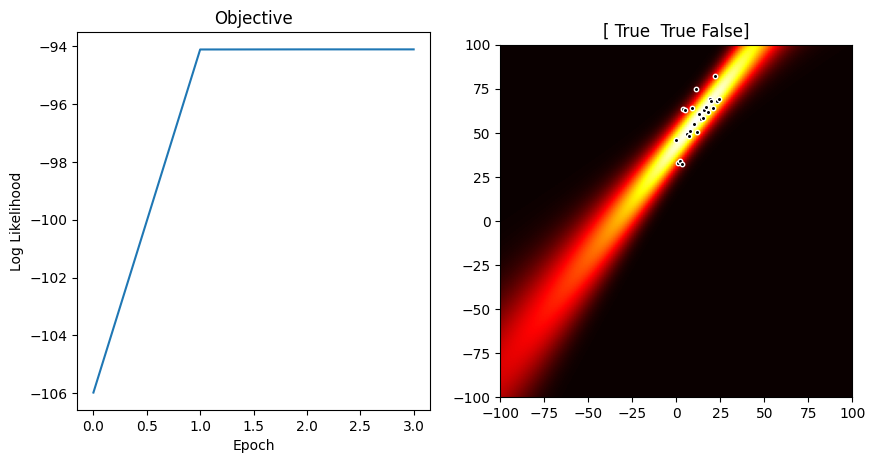

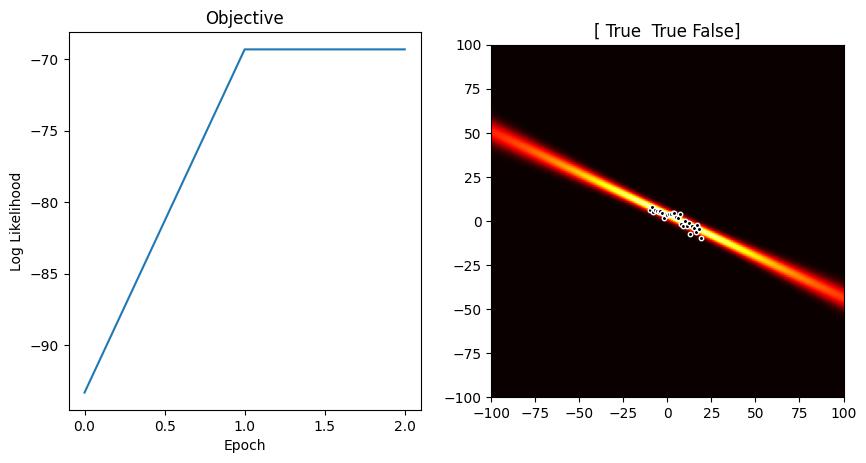

In [19]:
for i in range(8):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    X = np.concatenate([X, 100*np.random.normal(size=X.shape)], axis=-1)
    plt.figure(figsize=(10,5), dpi=dpi)
    plt.subplot(1,2,1)
    slr = SLR(X, w, disp=True)
    X = X[:,:1]
    t = np.array([norm.pdf(ls[::-1], *slr.pred(np.array([y,0]))) for y in ls]).reshape([n,n]).T
    plt.subplot(1,2,2)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)
    plt.title(str(slr.r))

As expected, the added noisy 3rd dimension got pruned in all cases. Notice that one of the samples lost its 2nd dimension as well since its line slope is ~0.

<a id='dblr'></a>

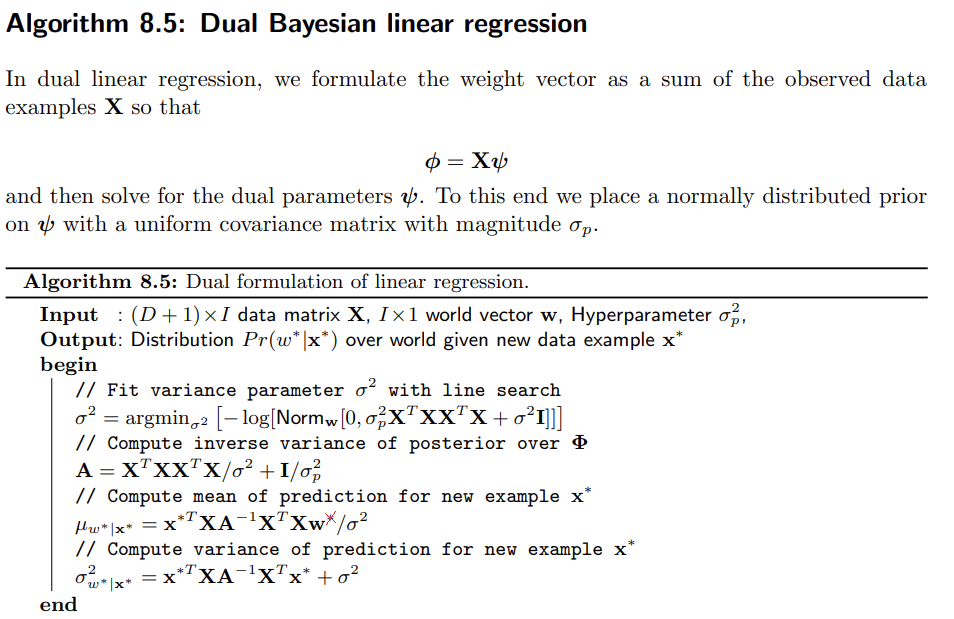

Let's define a class for this model...

In [20]:
class DBLR():
    
    def __init__(self, X, w, sp=1e+1, S=100): 
        
        S = np.linspace(np.var(w), 0, S, endpoint=False)
        n, D = X.shape
        X = self.X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        w = self.w = w[:,x]
        Y = mm(X.T, X, X.T, X)
        self.s = s = S[np.argmax([norm.logpdf(w[:,0], np.zeros([n]), sp * Y + s * np.identity(n)) for s in S])]
        self.A = inv(Y / s + np.identity(n) / sp)
        
    def pred(self, y):
        y = np.concatenate([[1], y], axis=-1)[:,x]
        A, X, w, s = self.A, self.X, self.w, self.s
        u = mm(y.T, X, A, X.T, X, w)[0,0] / s
        s = mm(y.T, X, A, X.T, y)[0,0] + s
        return u, s

Let's fit appropriate models to some randomly sampled noisy lines with many added dimensions containing zeros, and then visualize the predicted distributions over a range of examples...

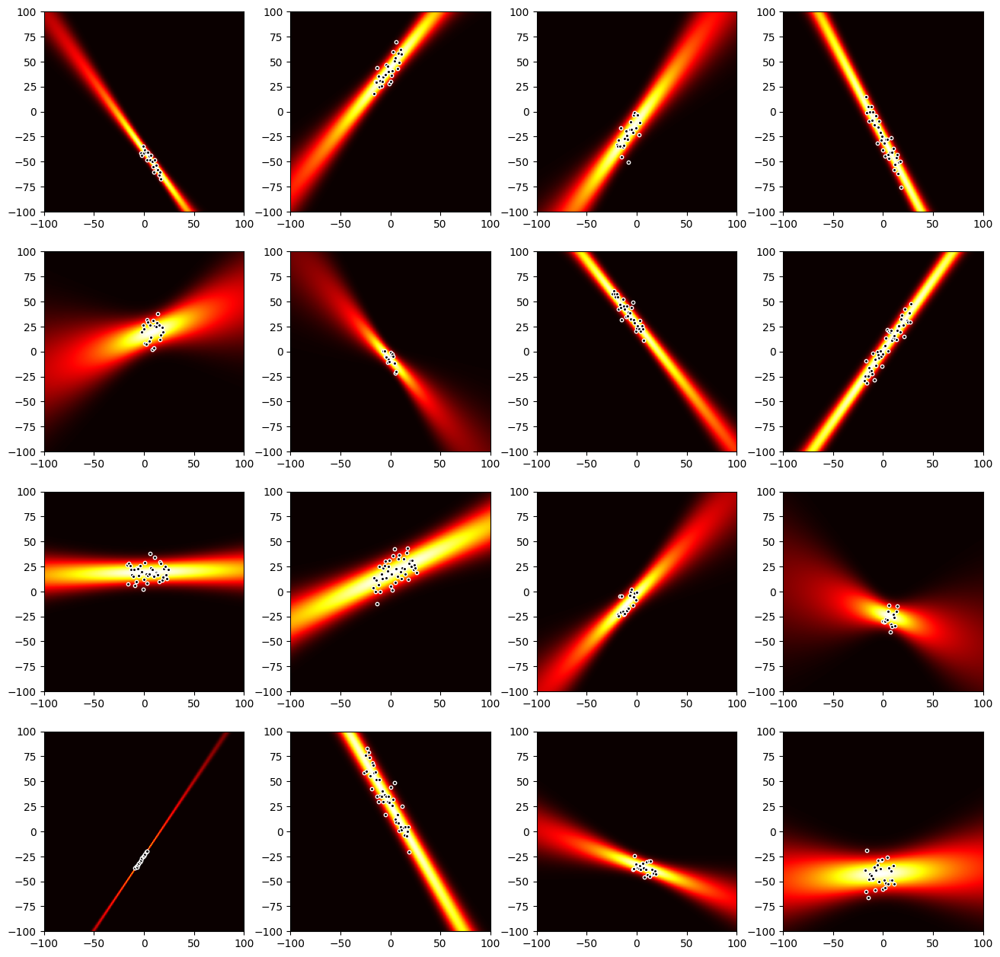

In [21]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    X = np.concatenate([X, *[np.zeros(X.shape) for i in range(1000)]], axis=-1)
    dblr = DBLR(X, w)
    X = X[:,:1]
    t = np.array([norm.pdf(ls[::-1], *dblr.pred(np.array([y, *1000*[0]]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

<a id='dgpr'></a>

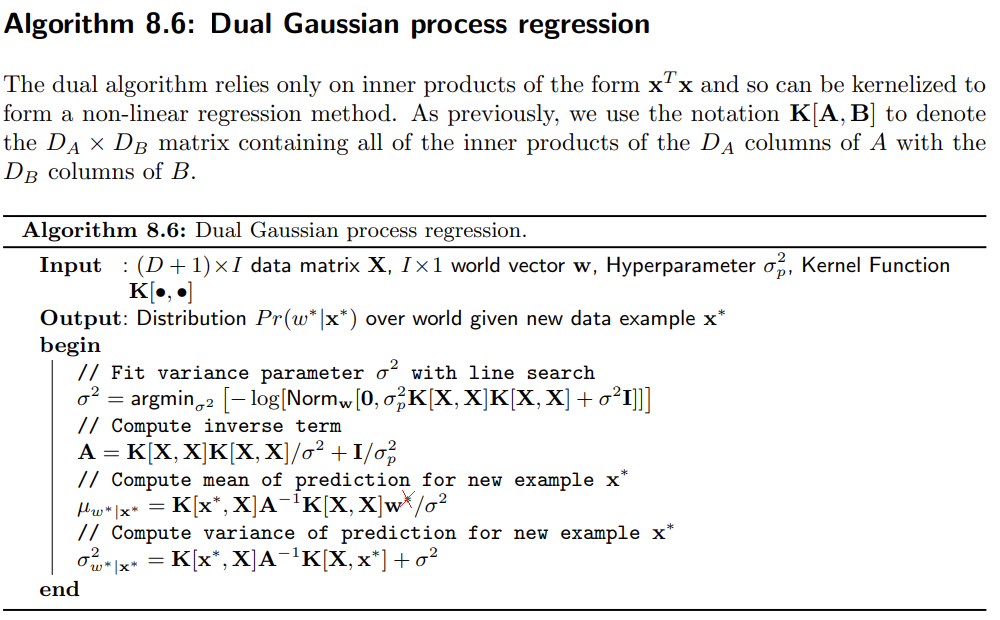

Let's define a class for this model...

In [22]:
class DGPR():
    
    def __init__(self, X, w, K, args=[], sp=1e+3, S=100):
        
        S = np.linspace(np.var(w), 0, S, endpoint=False)
        n, D = X.shape
        X = self.X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        w = self.w = w[:,x]
        self.K = K
        self.args = args
        K = K(X,X,*args)
        Y = mm(K, K)
        s = self.s = S[np.argmax([norm.logpdf(w[:,0], np.zeros([n]), sp * Y + s * np.identity(n)) for s in S])]
        Z = self.Z = inv(Y / s + np.identity(n) / sp)
        self.u = mm(Z, K, w) / s
        
    def pred(self, y):
        y = np.concatenate([[1], y], axis=-1)[:,x]
        Z, u, K, args, X, s = self.Z, self.u, self.K, self.args, self.X, self.s
        K = K(y,X,*args)
        u = mm(K, u)[0,0]
        s = mm(K, Z, K.T)[0,0] + s
        return u, s

Let's use a linear kernel to fit appropriate models to some randomly sampled noisy lines and visualize the predicted distributions over a range of examples...

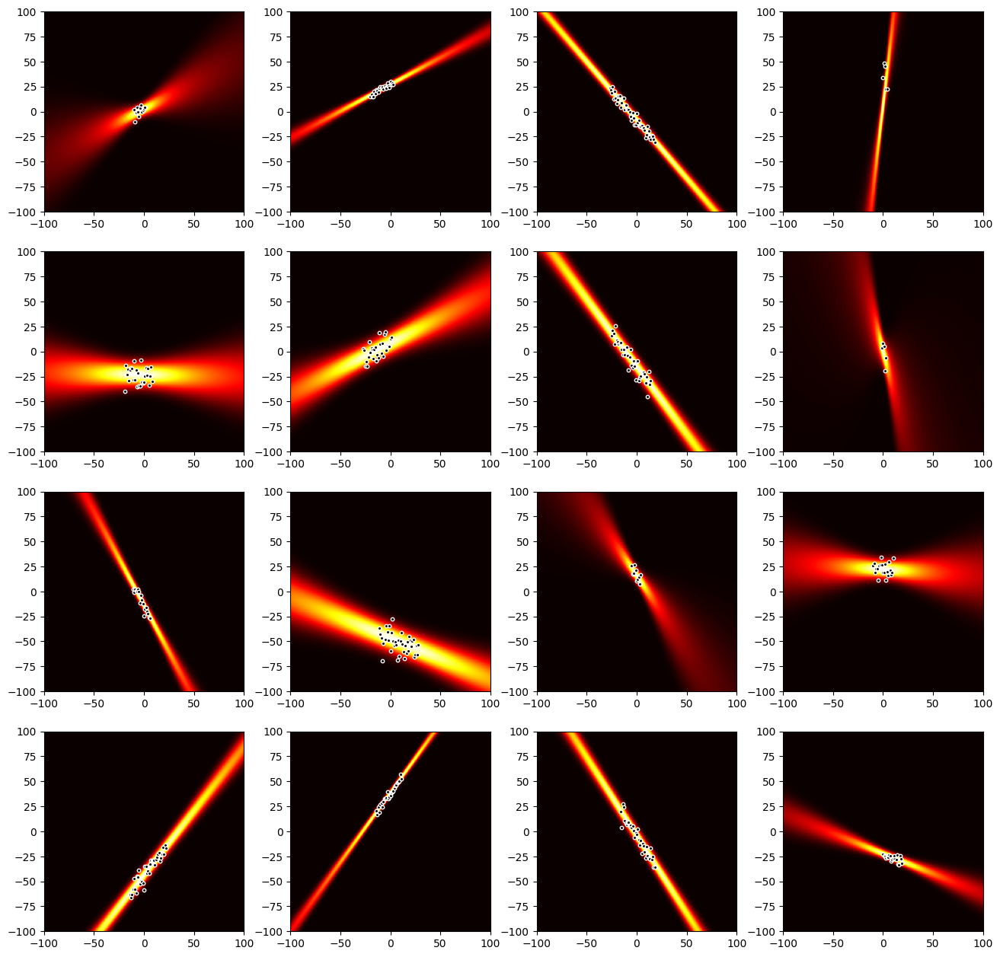

In [23]:
start, end, n = -100, 100, 200
ls = np.linspace(start,end,n)
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    dgpr = DGPR(X, w, K=linear, args=[4])
    t = np.array([norm.pdf(ls[::-1], *dgpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use a degree 2 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 2 polynomials and visualize the predicted distributions over a range of examples...

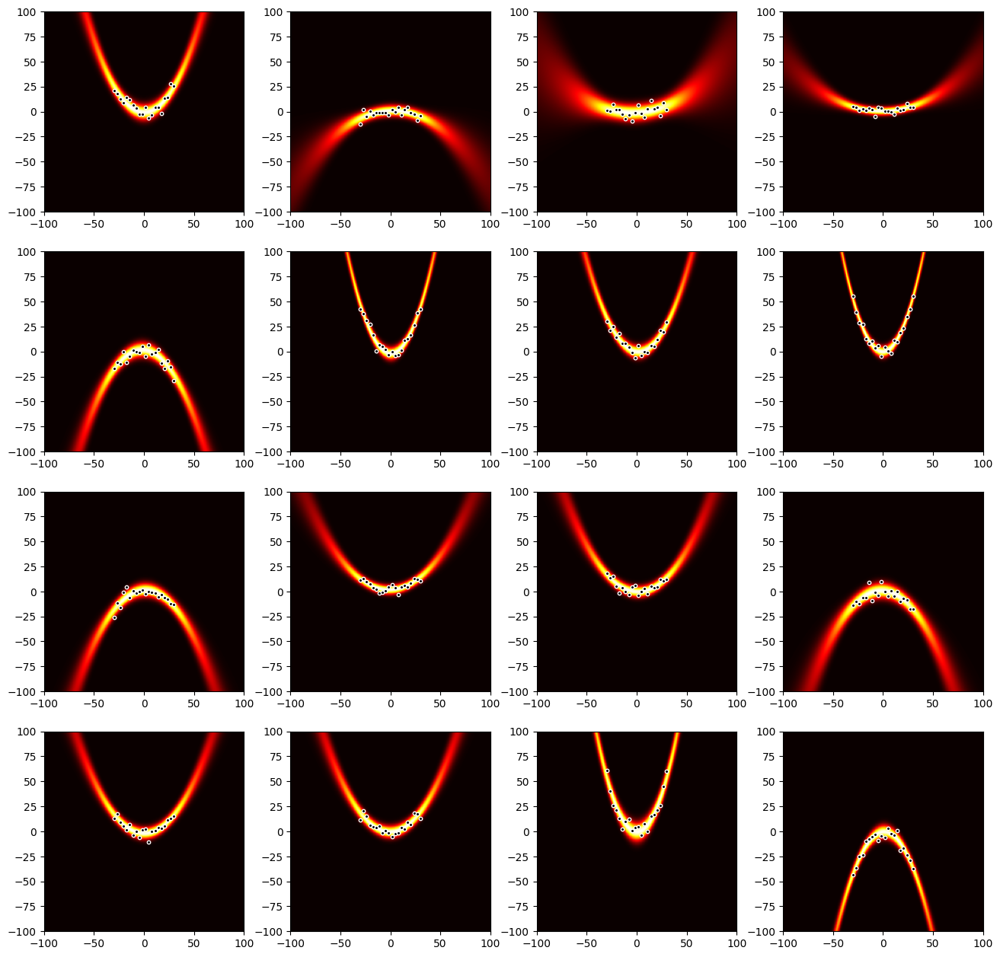

In [24]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=3)/40)
    dgpr = DGPR(X, w, K=polynomial, args=[2, 16])
    t = np.array([norm.pdf(ls[::-1], *dgpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use a degree 3 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 3 polynomials and visualize the predicted distributions over a range of examples...

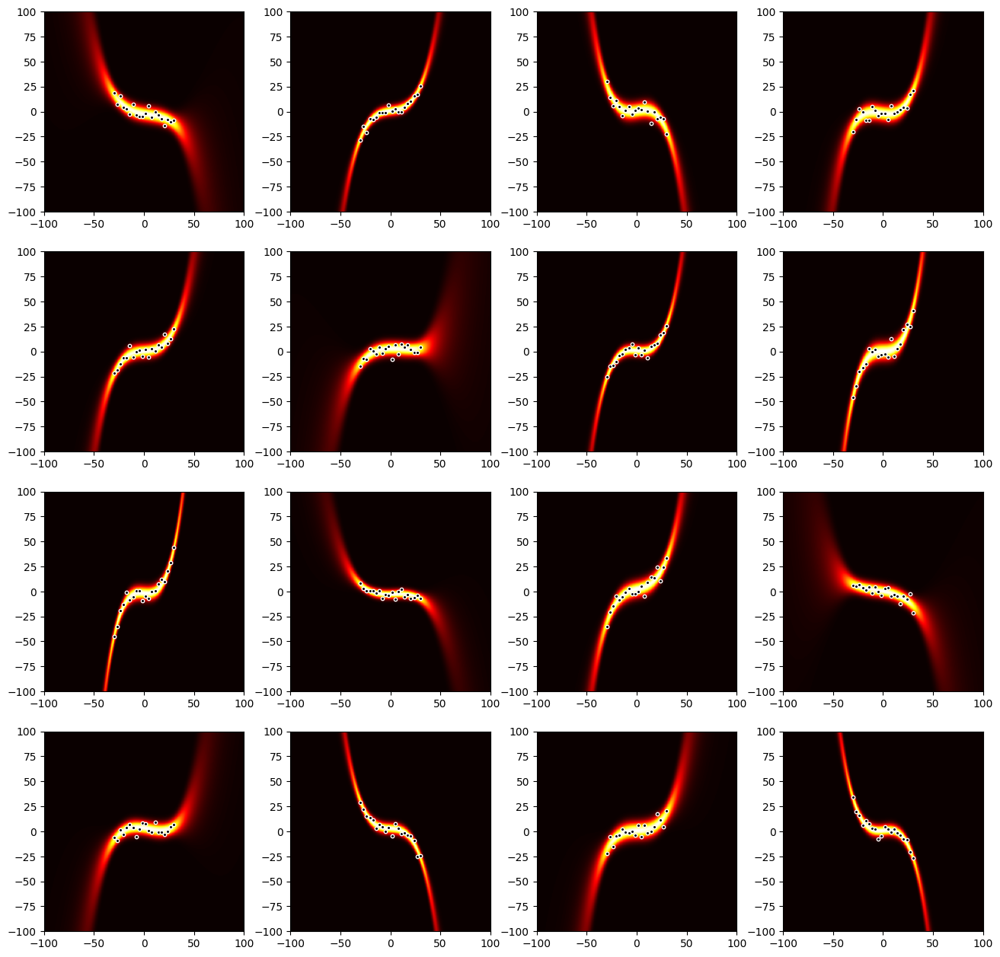

In [25]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=4)/1000)
    dgpr = DGPR(X, w, K=polynomial, args=[3, 20])
    t = np.array([norm.pdf(ls[::-1], *dgpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

Let's use an RBF kernel to fit appropriate models to some randomly sampled noisy weighted sums of RBFs and visualize the predicted distributions over a range of examples...

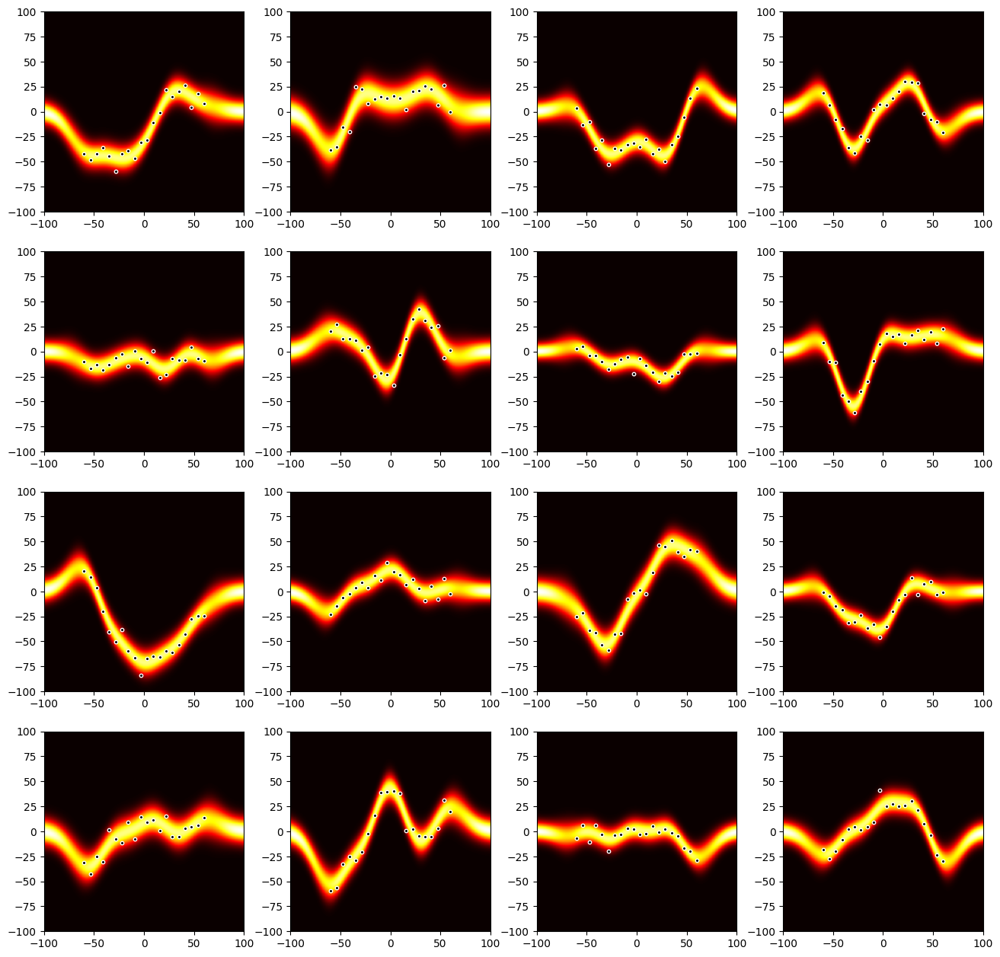

In [26]:
plt.figure(figsize=(16,16), dpi=dpi)
for i in range(16):
    X, w = sampleNoisyRBF(X=np.linspace(-1,1,20), coefs=np.random.normal(size=5), centers=np.linspace(-1,1,5))
    X *= 60
    w *= 30
    dgpr = DGPR(X, w, K=RBF, args=[16])
    t = np.array([norm.pdf(ls[::-1], *dgpr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(4,4,i+1)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=10)

<a id='rvr'></a>

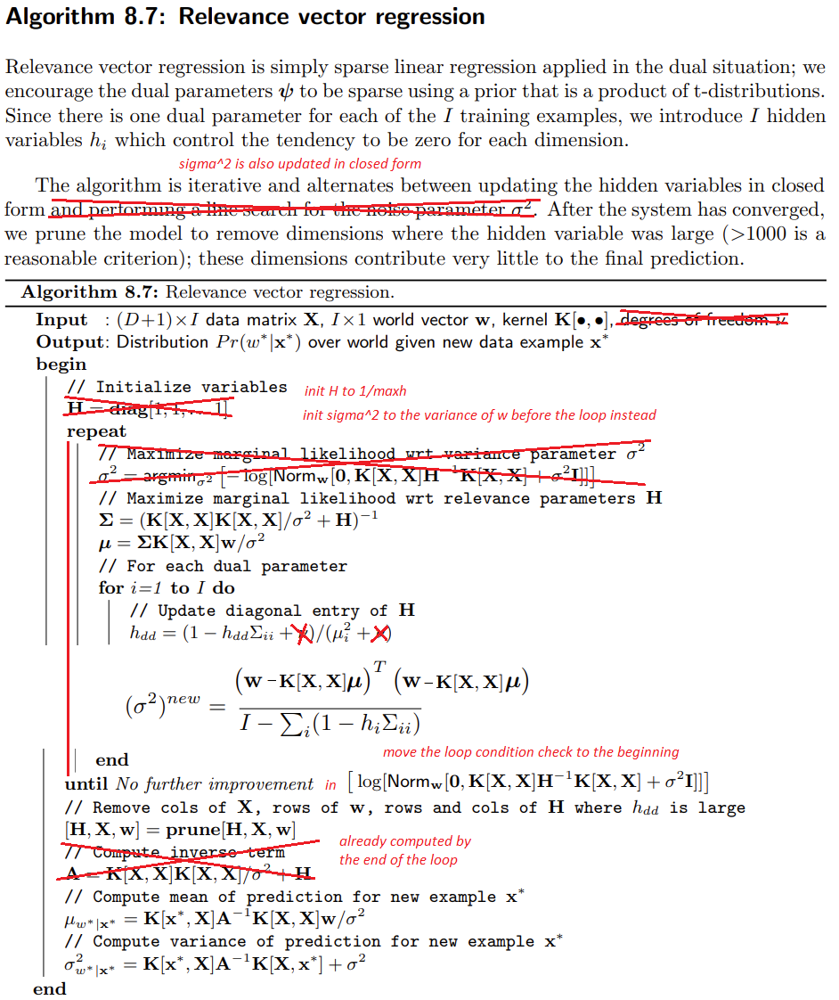

Unsurprisingly, some of the mistakes that appeared in the sparse linear regression algorithm are present here as well.

Let's define a class for this model...

In [27]:
class RVR():
    
    def __init__(self, X, w, K, args=[], delta=1e-3, maxh=1e+3, epochs=100, disp=False):
        
        n, D = X.shape
        X = self.X = np.concatenate([np.ones([1,n]), X.T], axis=0)
        w = self.w = w[:,x]
        self.K = K
        self.args = args
        K = K(X,X,*args)
        Y = mm(K, K)
        s = np.var(w)
        H = np.full(n, 1/maxh)
        L = [-np.inf]
        while epochs:
            L.append(norm.logpdf(w[:,0], np.zeros([n]), mm(K / H, K) + s * np.identity(n)))
            if L[-1] - L[-2] < delta:
                break
            Z = inv(Y / s + np.diag(H))
            u = mm(Z, K, w) / s
            s = np.sum((w - mm(K,u))**2) / (n - np.sum(1 - H * np.diag(Z)))
            H = np.minimum((1 - H * np.diag(Z)) / u[:,0]**2, maxh)
            epochs -= 1
            
        if disp:
            plotObjective(L[1:])
            
        self.r = r = H < maxh
        self.X = X[:,r]
        self.Z = Z[r][:,r]
        self.u = u[r]
        self.s = s
        
    def pred(self, y):
        r, Z, u, X, K, args, s = self.r, self.Z, self.u, self.X, self.K, self.args, self.s
        y = np.concatenate([[1], y], axis=-1)[:,x]
        K = K(y,X,*args)
        u = mm(K, u)[0,0]
        s = mm(K, Z, K.T)[0,0] + s
        return u, s

Let's use a linear kernel to fit appropriate models to some randomly sampled noisy lines, illustrate the algorithm's convergence and pruning, and visualize the predicted distributions over a range of examples...

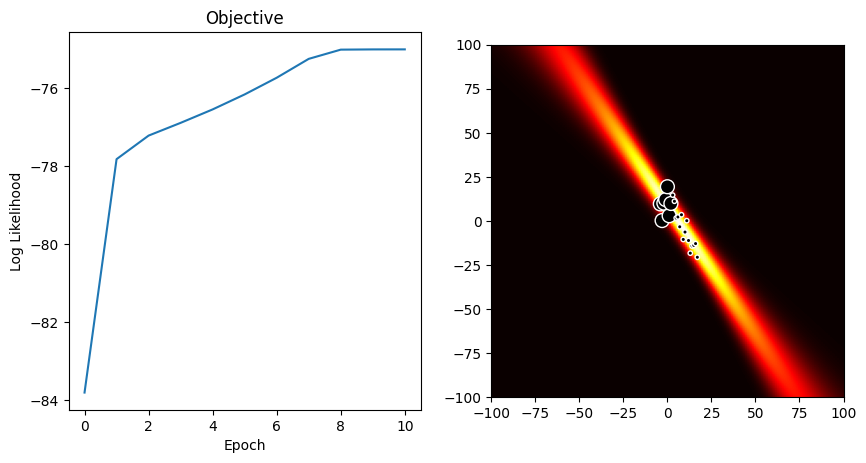

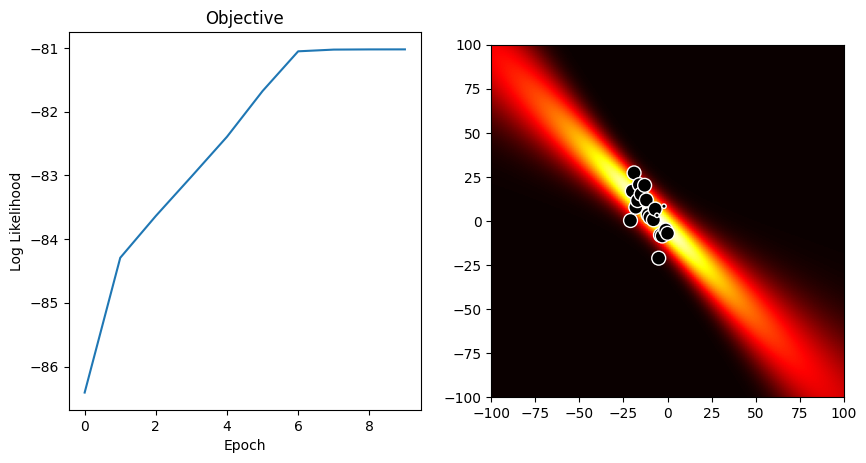

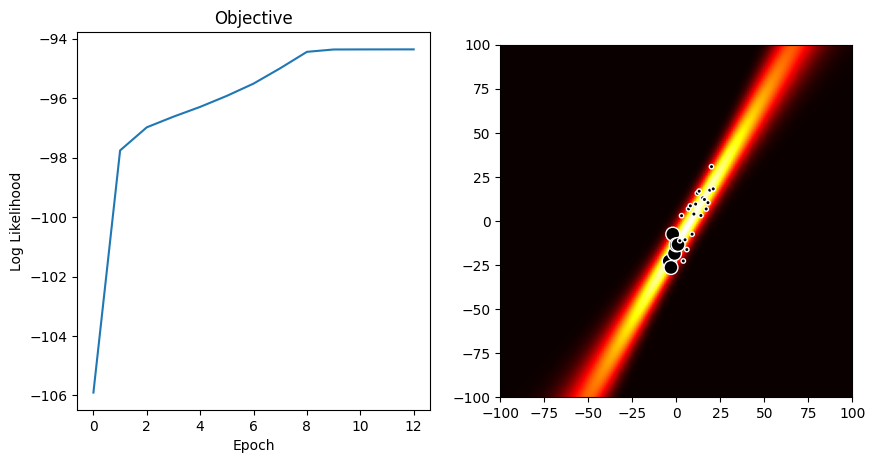

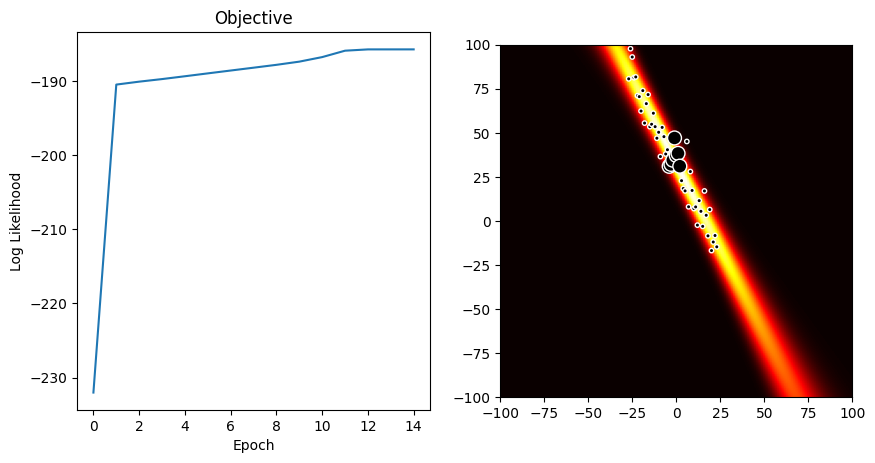

In [28]:
for i in range(4):
    X, w = sampleNoisyLine(X=np.arange(-np.random.randint(30), 1+np.random.randint(30)),
                           a=np.random.choice([-1,1])*np.random.rand()*50, 
                           b=np.random.choice([-1,1])*np.random.rand()*2, 
                           s=np.random.rand()*100)
    plt.figure(figsize=(10,5), dpi=dpi)
    plt.subplot(1,2,1)
    rvr = RVR(X, w, linear, args=[4], disp=True)
    t = np.array([norm.pdf(ls[::-1], *rvr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(1,2,2)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=np.where(rvr.r, 100, 10))

Notice that the relevance vector regression model prunes examples (the small points in the scatter plot are pruned) whereas the sparse linear regression model prunes features.

Let's use a degree 2 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 2 polynomials, illustrate the algorithm's convergence and pruning, and visualize the predicted distributions over a range of examples...

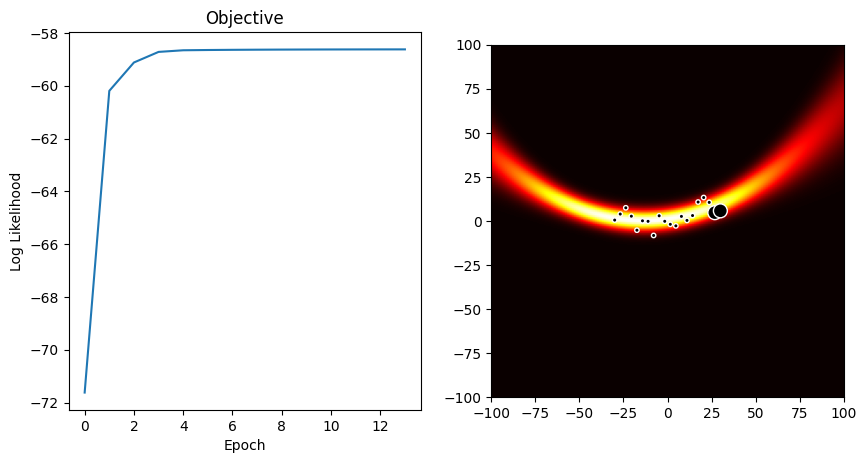

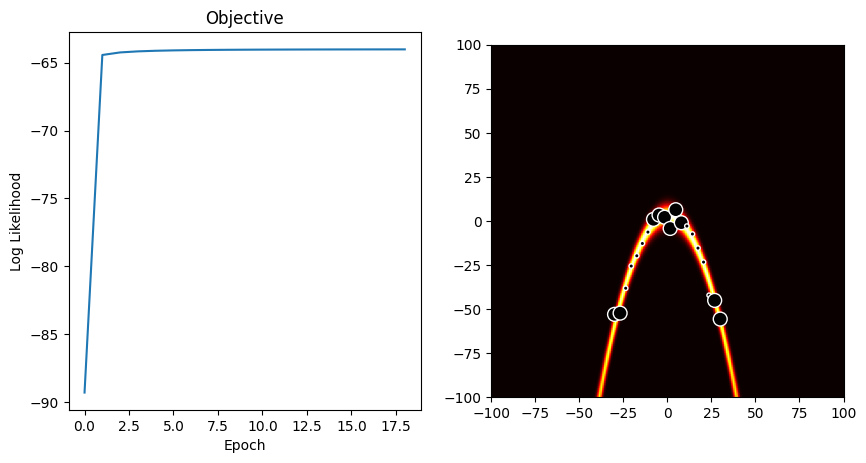

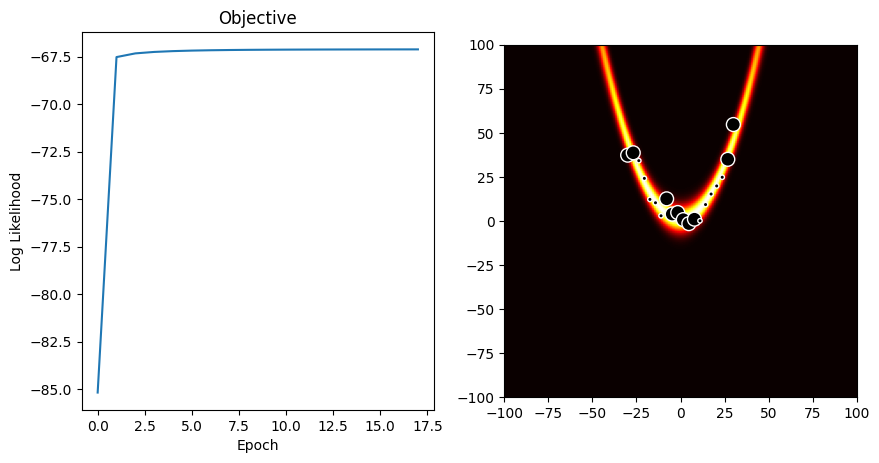

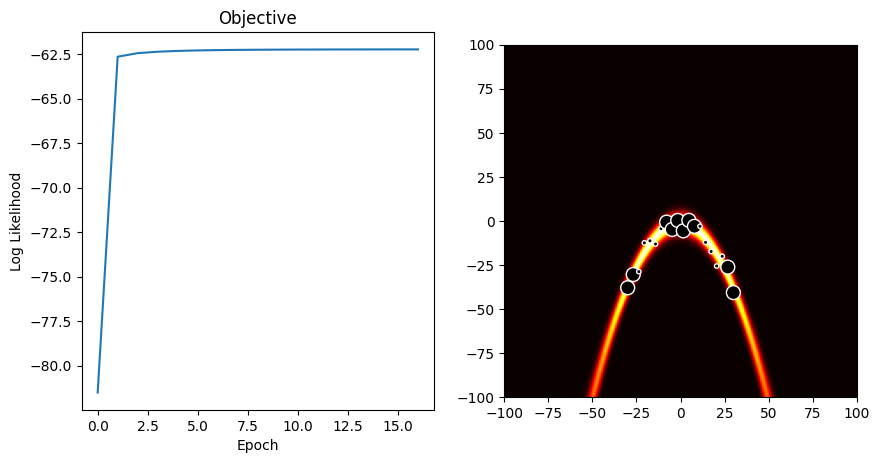

In [29]:
for i in range(4):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=3)/40)
    plt.figure(figsize=(10,5), dpi=dpi)
    plt.subplot(1,2,1)
    rvr = RVR(X, w, polynomial, args=[2,20], disp=True)
    t = np.array([norm.pdf(ls[::-1], *rvr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(1,2,2)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=np.where(rvr.r, 100, 10))

Let's use a degree 3 polynomial kernel to fit appropriate models to some randomly sampled noisy degree 3 polynomials, illustrate the algorithm's convergence and pruning, and visualize the predicted distributions over a range of examples...

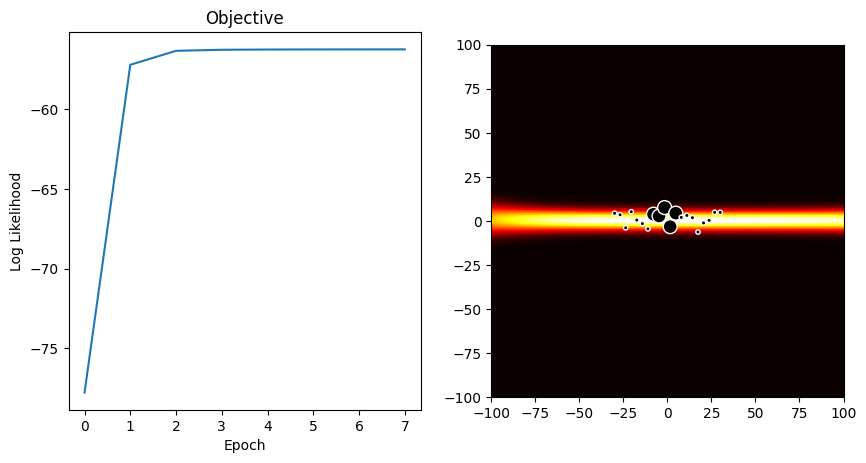

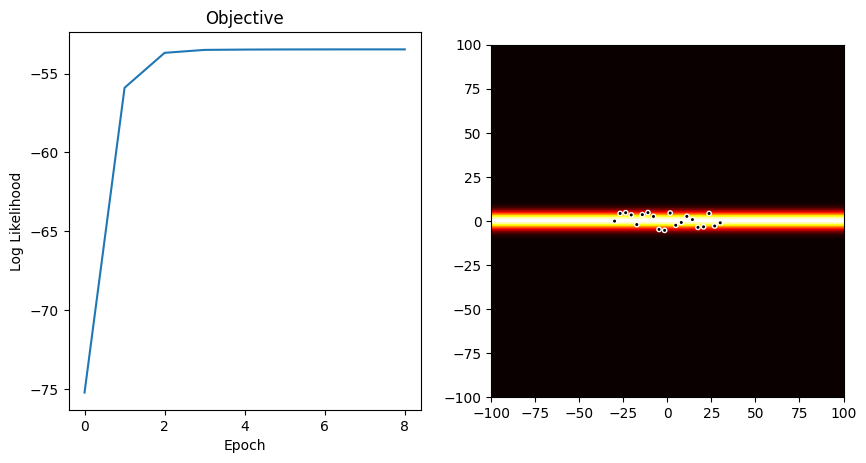

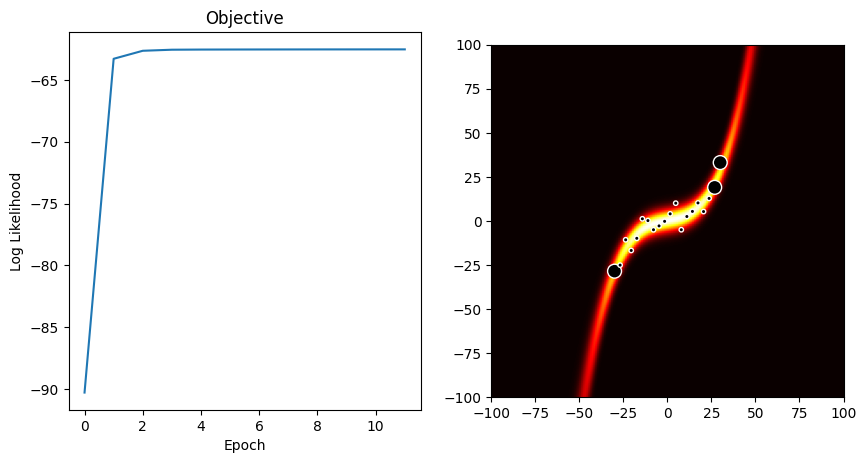

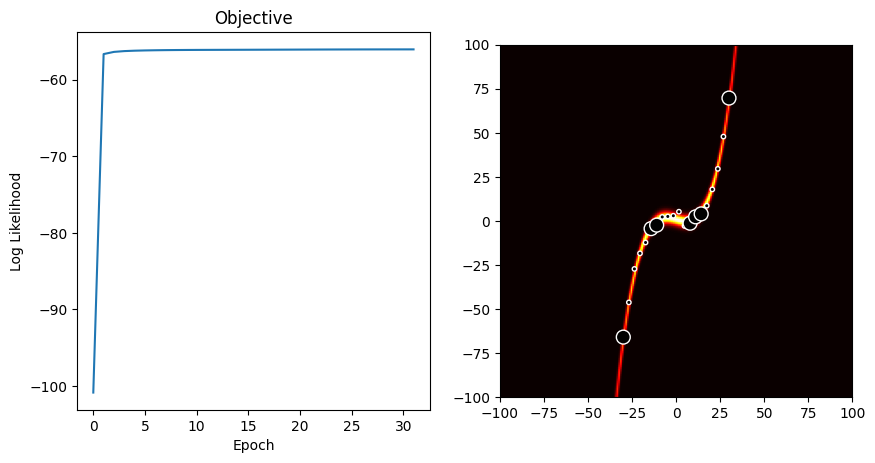

In [30]:
for i in range(4):
    X, w = sampleNoisyPolynomial(coefs=np.random.normal(size=4)/1000)
    plt.figure(figsize=(10,5), dpi=dpi)
    plt.subplot(1,2,1)
    rvr = RVR(X, w, polynomial, args=[3,16], disp=True)
    t = np.array([norm.pdf(ls[::-1], *rvr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(1,2,2)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=np.where(rvr.r, 100, 10))

Let's use an RBF kernel to fit appropriate models to some randomly sampled noisy weighted sums of RBFs, illustrate the algorithm's convergence and pruning, and visualize the predicted distributions over a range of examples...

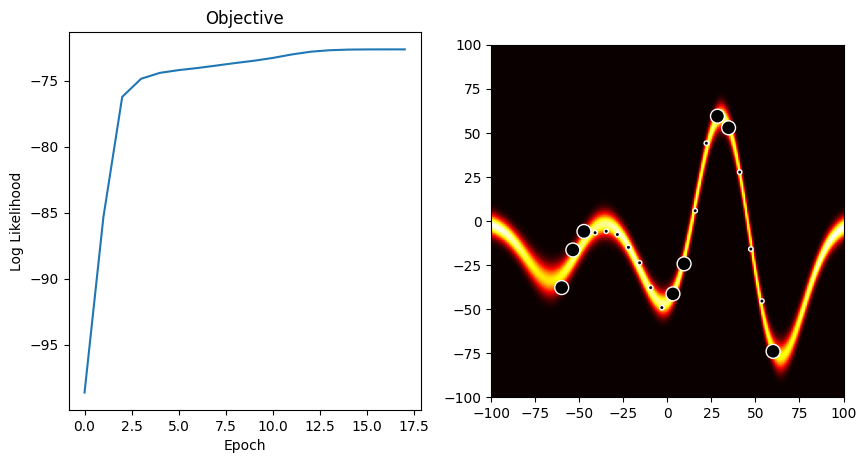

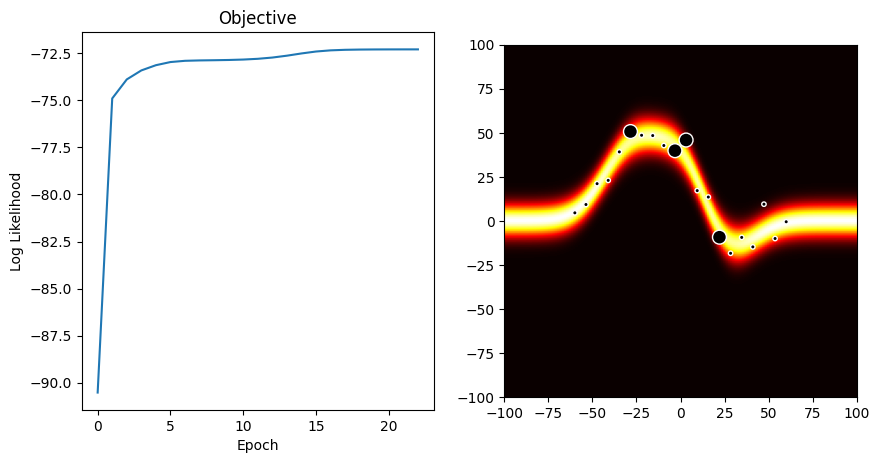

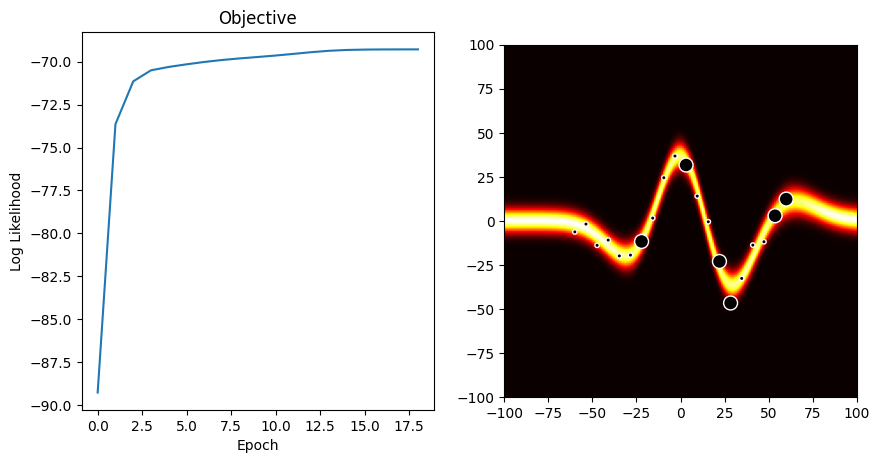

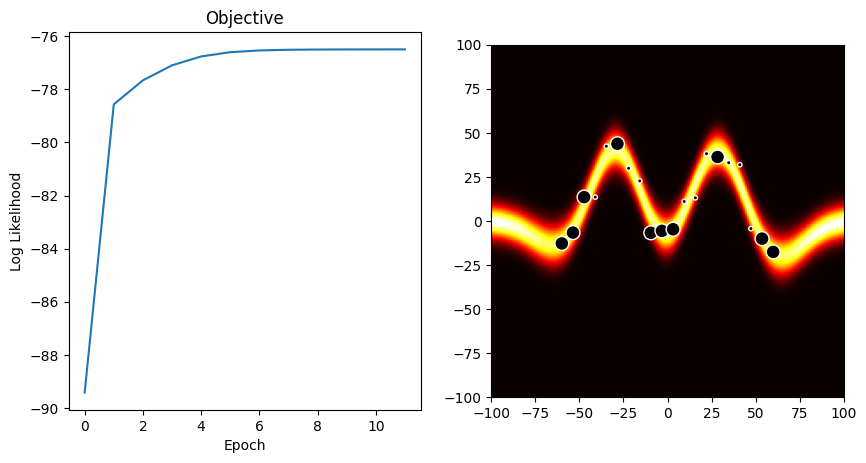

In [31]:
for i in range(4):
    X, w = sampleNoisyRBF(X=np.linspace(-1,1,20), coefs=np.random.normal(size=5), centers=np.linspace(-1,1,5))
    X *= 60
    w *= 30
    plt.figure(figsize=(10,5), dpi=dpi)
    plt.subplot(1,2,1)
    rvr = RVR(X, w, RBF, args=[16], disp=True)
    t = np.array([norm.pdf(ls[::-1], *rvr.pred(np.array([y]))) for y in ls]).reshape([n,n]).T
    plt.subplot(1,2,2)
    plt.imshow(t, cmap='hot', extent=[start, end, start, end])
    plt.scatter(X, w, color='black', edgecolors='white', s=np.where(rvr.r, 100, 10))

As a simple experiment, I will now use the relevance vector regression model to align images of handwritten digits taken from the popular MNIST dataset [[6](https://keras.io/api/datasets/mnist/)].

The MNIST dataset is quite large so let's prepare a small random dataset...

In [39]:
import cv2
from tensorflow import keras
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()
(x_train, y_train), (x_val, y_val) = (x_train[::2], y_train[::2]), (x_train[1::2], y_train[1::2])

# rotates and transforms the input image.
# translates by tx and ty.
# rotates by r degrees around image center.
# if invTrans = True, then the inverse of the above it performed.
def transformDigit(img, tx, ty, r, invTrans=False):
    
    c = np.array([img.shape[1]/2, img.shape[0]/2])
    if invTrans:
        c += [tx, ty]
        tx = -tx
        ty = -ty
        r = -r
    M = cv2.getRotationMatrix2D(tuple(c), r, 1)
    M[:,-1] += [tx, ty]
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))


# randomly select n samples of each numeral (n 1's, n 2's, ..., n 9's) out of x_train 
# and generate a random ground truth transformation for each sample.
# |t| = max translation size.
# |r| = max rotation angle.
def randomSet(x_train, y_train, t=5, r=45, n=10):
    
    rndImgs = np.concatenate([np.random.default_rng().choice(x_train[y_train == i], n, replace=False) 
                              for i in range(10)], axis=0)
    w = np.stack([np.random.uniform(-t, t, 10*n),
                  np.random.uniform(-t, t, 10*n), 
                  np.random.uniform(-r, r, 10*n)], axis=-1)
    X = np.array([transformDigit(img, *w) for img, w in zip(rndImgs,w)])
    return X, w


t, r = 5, 45
n_train, n_val, n_test = 100, 100, 30
X_train, w_train = randomSet(x_train, y_train, t=t, r=r, n=n_train)
X_val, w_val = randomSet(x_val, y_val, t=t, r=r, n=n_val)
X_test, w_test = randomSet(x_test, y_test, t=t, r=r, n=n_test)

Let's display the correctly restored test images that were randomly selected and their randomly transformed (rotated and translated) versions...

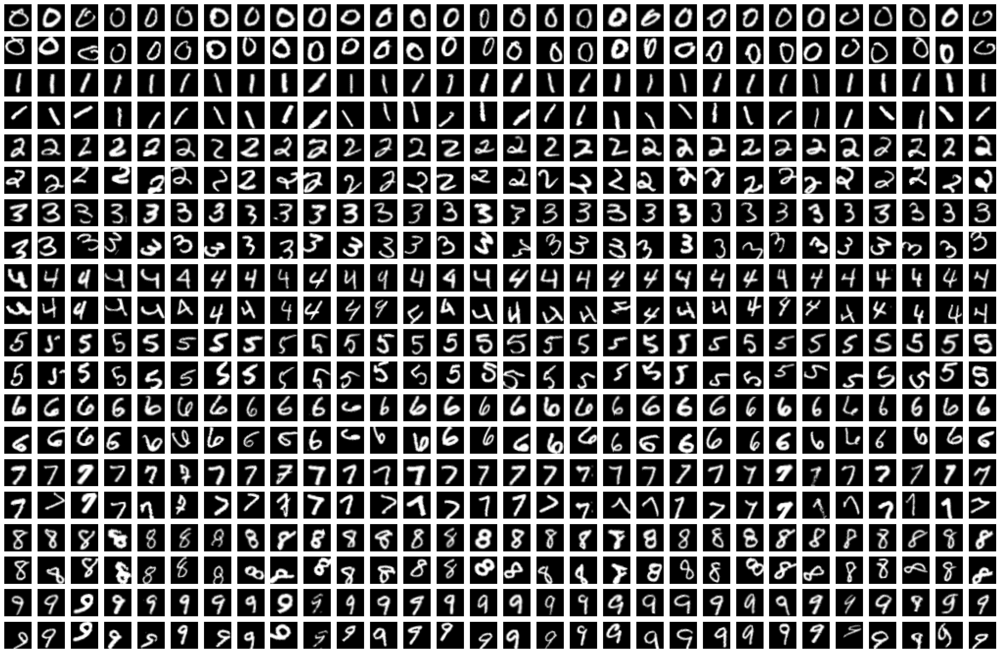

In [40]:
n = n_test
plt.figure(figsize=(n,20), dpi=dpi)
for i in range(10):
    for j in range(n):
        plt.subplot(20,n,2*n*i+j+1)
        plt.imshow(transformDigit(X_test[n*i+j], *w_test[n*i+j], invTrans=True), cmap='gray') 
        plt.axis('off')
    for j in range(n):
        plt.subplot(20,n,2*n*i+j+n+1)
        plt.imshow(X_test[n*i+j], cmap='gray')
        plt.axis('off')

The first row of each numeral was produced by applying the inverse transformation of the corresponding ground truth on the images of the numerals in the second row, and thus the original images are restored.

Let's use HOG features [[7](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients)] in lieu of raw pixel intensity values and normalize them to improve accuracy...

In [41]:
# produces HOG features
def hog(img):
    b = 16
    c = 14
    gx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=1)
    gy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=1)
    mag, ang = cv2.cartToPolar(gx, gy)
    bins = np.int32(b * ang / (2 * np.pi))
    hist = []
    for i in range(28//c):
        for j in range(28//c):
            bin_cells = bins[c*i:c*(i+1),c*j:c*(j+1)]
            mag_cells = mag[c*i:c*(i+1),c*j:c*(j+1)]
            hist += [np.bincount(bin_cells.ravel(), mag_cells.ravel(), b)]    
    return np.hstack(hist)


h = np.array([hog(img) for img in X_train])
mean, std = np.mean(h, axis=0), np.std(h, axis=0)
def trans(imgs):
    X_hog = np.array([hog(img) for img in imgs])
    X_std = (X_hog - mean) / std
    X_nrm = X_std / np.sum(X_std**2, axis=1)[:,x]**0.5
    return X_nrm
    
    
X_train_norm = trans(X_train)
w_train_norm = w_train / [t,t,r]

X_val_norm = trans(X_val)
w_val_norm = w_val / [t,t,r]

X_test_norm = trans(X_test)
w_test_norm = w_test / [t,t,r]

The feature extraction and normalization procedure in the above code is similar to the one I used in my previous project (see [[5](https://nbviewer.org/github/tal4080/EM-Algo/blob/main/EM-Algo.ipynb)] for more details).

We need to train 3 separate RVR models since the target is 3-dimensional (translation w.r.t x and y, and a rotation angle)...

In [42]:
class digitTransRegressor():
    
    def __init__(self, X, w, K, args=[], maxh=1e+3):
        self.rvr_tx = RVR(X, w[:,0], K, [args[0]], maxh)
        self.rvr_ty = RVR(X, w[:,1], K, [args[1]], maxh)
        self.rvr_r = RVR(X, w[:,2], K, [args[2]], maxh)
        
    def pred(self, y):
        return np.array([self.rvr_tx.pred(y)[0], 
                         self.rvr_ty.pred(y)[0], 
                         self.rvr_r.pred(y)[0]])

The above class simply combines 3 RVR models and returns the predictions' means on demand.

The problem at hand is relatively complex and so using an RBF kernel would be ideal; let's find separate kernel smoothness levels for each of the 3 RVR models which are low enough to fit the training set but high enough to avoid overfitting it...

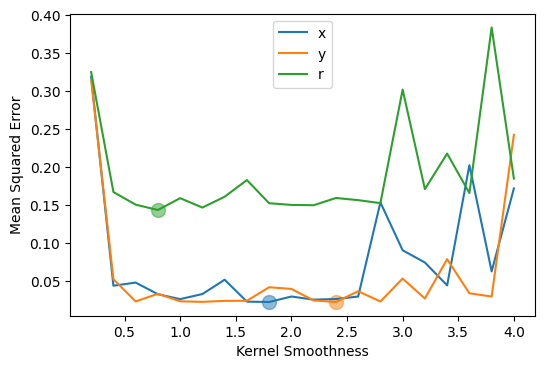

In [46]:
plt.figure(dpi=dpi)
best = []
for j, m in enumerate(['x','y','r']):
    L = []
    lin = np.linspace(0.2,4.0,20)
    for z in lin:
        try:
            rvr = RVR(X_train_norm, w_train_norm[:,j], K=RBF, args=[z], maxh=100)
            L.append(np.mean([(w_val_norm[i,j] - rvr.pred(X_val_norm[i])[0])**2 for i in range(len(X_val))]))
        except:
            L.append(np.inf)
    best.append(lin[np.argmin(L)])
    plt.plot(lin, L, label=m)
    plt.scatter(x=[best[j]], y=[np.min(L)], s=100, alpha=0.5)
plt.legend()
plt.xlabel('Kernel Smoothness')
plt.ylabel('Mean Squared Error');

In the above figure we can see the MSE on the validation set for increasing levels of kernel smoothness w.r.t each of the 3 RVR models. We can see the models initially overfit and then quickly get better as the smoothness level is increased; once the smoothness level passes the minimum point, the models slowly start to underfit.

Let's use the above minimum points as arguments for the combined model...

In [47]:
dtr = digitTransRegressor(X_train_norm, w_train_norm, K=RBF, args=best, maxh=100)

Let's display the correctly restored test images and their corrected versions according to the model's predictions...

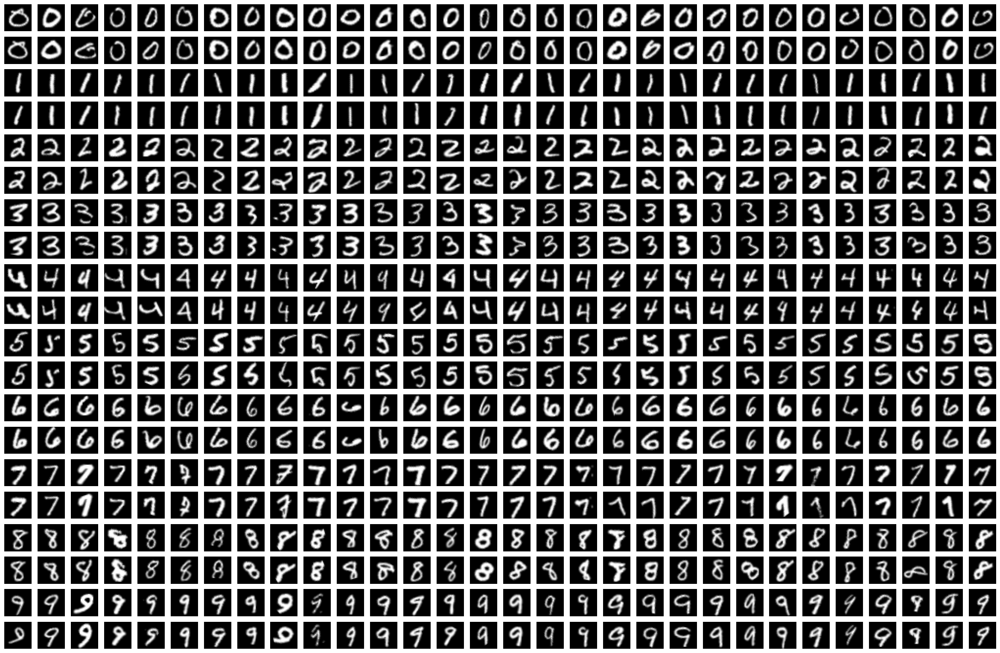

In [48]:
plt.figure(figsize=(n,20), dpi=dpi)
for i in range(10):
    for j in range(n):
        plt.subplot(20,n,2*n*i+j+1)
        plt.imshow(transformDigit(X_test[n*i+j], *w_test[n*i+j], invTrans=True), cmap='gray') 
        plt.axis('off')
    for j in range(n):
        plt.subplot(20,n,2*n*i+j+n+1)
        plt.imshow(transformDigit(X_test[n*i+j], *(dtr.pred(X_test_norm[n*i+j]) * [t,t,r]), invTrans=True), cmap='gray')
        plt.axis('off')

The first row of each numeral is the correctly restored result, and the second row is the result obtained by using the inverse transformation of the predictions. Although I used only 1,000 training examples (the full training set contains 60,000 images) in total, the results look much better than the randomly transformed originals as we can see in the following GIF [[8](https://ezgif.com/maker)]:

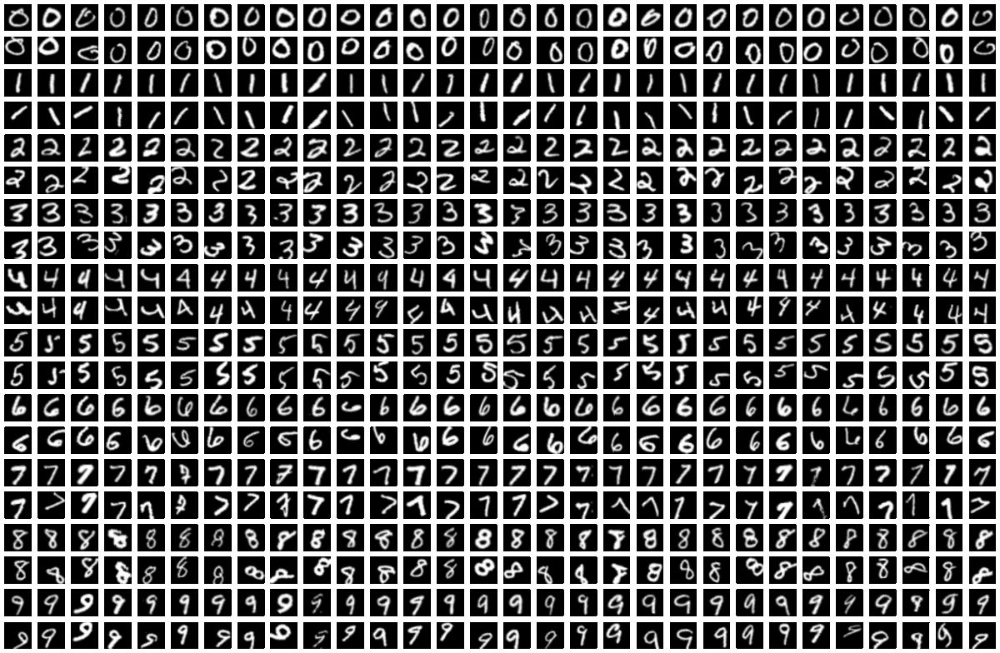

Note that the above GIF is composed of the previous two images.

# References 

[1] http://www.computervisionmodels.com/

[2] http://web4.cs.ucl.ac.uk/staff/s.prince/book/book.pdf

[3] http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf

[4] https://en.wikipedia.org/wiki/68%E2%80%9395%E2%80%9399.7_rule

[5] https://nbviewer.org/github/tal4080/EM-Algo/blob/main/EM-Algo.ipynb

[6] https://keras.io/api/datasets/mnist/

[7] https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients

[8] https://ezgif.com/maker